<a href="https://colab.research.google.com/github/KelestZ/HighResImg_Gen/blob/master/gcn_vae_gan_v4.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [3]:
!pip3 install python-igraph
!pip3 install powerlaw

     |████████████████████████████████| 378kB 3.4MB/s 
  Stored in directory: /root/.cache/pip/wheels/41/d6/02/34eebae97e25f5b87d60f4c0687e00523e3f244fa41bc3f4a7
Successfully built python-igraph
  Stored in directory: /root/.cache/pip/wheels/e0/27/02/08d0e2865072bfd8d7c655e290521e3feca3fc22f1ac460601
Successfully built powerlaw


In [1]:
from google.colab import drive
drive.mount('/content/gdrive/')
import os    
os.chdir("/content/gdrive/My Drive/gcn-data/")
!ls


Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3Aietf%3Awg%3Aoauth%3A2.0%3Aoob&scope=email%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdocs.test%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive.photos.readonly%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fpeopleapi.readonly&response_type=code

Enter your authorization code:
··········
Mounted at /content/gdrive/
graph_stat.py  sub.label.dat  sub.link.dat  sub.node.dat


In [0]:
import torch
import torch.nn.functional as F
import torch.nn as nn
from torch.autograd import Variable
import numpy as np
import math
from torch.nn.parameter import Parameter
from torch.nn.modules.module import Module
import numpy as np
from sklearn.manifold import SpectralEmbedding
import torch.optim as optim
import warnings
import scipy.sparse as sp
from pprint import pprint
from graph_stat import *
warnings.filterwarnings("ignore")


In [5]:
a = np.array([
    [0, 1, 0],
    [1, 0, 0],
    [0, 0, 0]
])
compute_graph_statistics(a)

Values less than or equal to 0 in data. Throwing out 0 or negative values


{'LCC': 2,
 'claw_count': 0.0,
 'cpl': 1.0,
 'd': 0.6666666666666666,
 'd_max': 1,
 'd_min': 0,
 'edge_num': 1,
 'gini': -0.33333333333333326,
 'n_components': 2,
 'node_num': 3,
 'power_law_exp': inf,
 'rel_edge_distr_entropy': 0.6308387341996874,
 'square_count': 0,
 'triangle_count': 0,
 'wedge_count': 0.0}

In [6]:
import torch
a = torch.Tensor([1]).cuda()
print(a)
torch.cuda.is_available()

tensor([1.], device='cuda:0')


True

In [0]:
%matplotlib inline
import matplotlib.pyplot as plt
import networkx as nx
import copy

def show_graph(adj, thresh=.5):
    if not isinstance(adj, np.ndarray):
        adj_ = adj.data.cpu().numpy()
    else:
        adj_ = copy.deepcopy(adj)
    # adj_ = adj_ / np.max(adj_)
    rows, cols = np.where(adj_ > thresh)
    if rows.size == 0:
        print('empty graph to print')
        return
    edges = zip(rows.tolist(), cols.tolist())
    gr = nx.Graph()
    gr.add_edges_from(edges)
    nx.draw(gr, node_size=30)
    plt.show()
    #a = nx.to_numpy_array(gr)
    #pprint(compute_graph_statistics(a))
    
    
def make_symmetric(m):
    m_ = torch.transpose(m)
    w = torch.max(m_, m_.T)
    return w


def make_adj(x, n):
    res = torch.zeros(n, n).cuda()
    i = 0
    for r in range(1, n):
        for c in range(r, n):
            res[r, c] = x[i]
            res[c, r] = res[r, c]
            i += 1
    return res


def cat_attr(x, attr_vec):
    if not attr_vec:
        return x
    attr_mat = attr_vec.repeat(x.size()[0], 1)
    x = torch.cat([x, attr_mat], dim=1)
    return x


def get_spectral_embedding(adj, d):
    """
    Given adj is N*N, return its feature mat N*D, D is fixed in model
    :param adj:
    :return:
    """
    adj_ = adj.data.cpu().numpy()
    emb = SpectralEmbedding(n_components=d)
    res = emb.fit_transform(adj_)
    x = torch.from_numpy(res).float().cuda()
    return x

def normalize(mx):
    """Row-normalize sparse matrix"""
    mx = mx.data.cpu().numpy()
    mx += sp.eye(mx.shape[0])
    rowsum = np.array(mx.sum(1))
    r_inv = np.power(rowsum, -1).flatten()
    r_inv[np.isinf(r_inv)] = 0.
    r_mat_inv = sp.diags(r_inv)
    mx = r_mat_inv.dot(mx)
    return torch.from_numpy(mx).float().cuda()

In [0]:
# from pprint import pprint
# from collections import defaultdict

# NODE_FILE = 'node.dat'
# LINK_FILE = 'link.dat'
# LABEL_FILE = 'label.dat'
# DATA_DIR = 'data'
# mat_names = []
# adj_mats = []
# id_maps = []

# cnt = 0
# for folder in os.listdir(DATA_DIR):
#     cnt += 1
#     if cnt > 100:
#         break
#     mat_names.append(folder)
#     id_to_item = {}
#     with open(os.path.join(DATA_DIR, folder, NODE_FILE), 'r') as f:
#         for i, line in enumerate(f):
#             cells = line.split('\t')
#             id_to_item[i] = cells[0]

#     all_items = set(id_to_item.values())
#     all_ids = set(id_to_item.keys())
        
#     links = defaultdict(set)
#     with open(os.path.join(DATA_DIR, folder, LINK_FILE), 'r') as f:
#         for line in f:
#             cells = line.rstrip('\n').split('\t')
#             from_id = int(cells[0])
#             to_id = int(cells[1])
#             if from_id in all_ids and to_id in all_ids:
#                 links[from_id].add(to_id)
    
#     N = len(all_ids)
#     adj = np.zeros((N, N))
#     for from_id in range(N):
#         for to_id in links[i]:
#             adj[from_id, to_id] = 1
#             adj[to_id, from_id] = 1
#     id_map = [id_to_item[i] for i in range(N)]
    
#     adj_mats.append(adj)
#     id_maps.append(id_map)
    

# t_adj_mats = [torch.from_numpy(m).float() for m in adj_mats]
# torch.manual_seed(0)
# t_attr_vecs = torch.randn(len(t_adj_mats), 8)
    

# for i in range(3):
#     print('No:', i, mat_names[i])
#     print('Adj Mat', adj_mats[i].shape)
#     print(adj_mats[i])
#     show_graph(adj_mats[i])
#     print('# of nodes', len(id_maps[i]))
#     print('# of links', np.count_nonzero(adj_mats[i]) // 2)
#     print('Item names', id_maps[i])
#     print('Attr vec', t_attr_vecs[i, :])


In [8]:
from pprint import pprint
from collections import defaultdict

NODE_FILE = 'sub.node.dat'
LINK_FILE = 'sub.link.dat'
LABEL_FILE = 'sub.label.dat'

id_to_author = {}
id_to_fv = {}
with open(NODE_FILE, 'r') as f:
    for i, line in enumerate(f):
        cells = line.split('\t')
        if cells[1] == '1':
            id_to_author[i] = cells[0]
            id_to_fv[i] = np.asarray([float(a) for a in cells[-1].split(',')])
all_authors = set(id_to_author.values())
all_ids = set(id_to_author.keys())

sg_to_ids = defaultdict(list)
author_to_id = {v: k for k, v in id_to_author.items()}
with open(LABEL_FILE, 'r') as f:
    for line in f:
        cells = line.rstrip('\n').split('\t')
        if cells[1] == '1' and cells[0] in all_authors:
            sg_to_ids[int(cells[2])].append(author_to_id[cells[0]])
for k, v in sg_to_ids.items():
    v.sort()
    
links = defaultdict(set)
with open(LINK_FILE, 'r') as f:
    for line in f:
        cells = line.rstrip('\n').split('\t')
        from_id = int(cells[0])
        to_id = int(cells[1])
        if from_id in all_ids and to_id in all_ids:
            links[from_id].add(to_id)
print('total links', sum(len(s) for s in links.values()))

adj_mats = []
id_maps = []
author_maps = []
feature_mats = []
M = len(id_to_fv[15055])
for sg, ids in sg_to_ids.items():
    N = len(ids)
    cur_ids = set(ids)
    adj_mat = np.zeros((N, N))
    feature_mat = np.zeros((N, M))
    row_map = {id: i for i, id in enumerate(ids)}
    for id in ids:
        for to_id in links[id]:
            if to_id not in cur_ids:
                continue
            r = row_map[id]
            c = row_map[to_id]
            adj_mat[r, c] = 1
            adj_mat[c, r] = 1
            feature_mat[r, :] = id_to_fv[id]
    adj_mats.append(adj_mat)
    id_maps.append(ids)
    author_maps.append([id_to_author[id] for id in ids])
    feature_mats.append(feature_mat)

for i in range(len(adj_mats)):
    print('Sub Group:', i)
    print('Adj Mat', adj_mats[i].shape)
    print(adj_mats[i])
    print('Feature Mat', feature_mats[i].shape)
    print(feature_mats[i])
    print('# of nodes', len(id_maps[i]))
    print('# of links', np.count_nonzero(adj_mats[i]) // 2)
    print('Author IDs', id_maps[i])
    print('Author Names', author_maps[i])



total links 89338
Sub Group: 0
Adj Mat (85, 85)
[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
Feature Mat (85, 300)
[[ 0.07215603  0.06144113  0.05818894 ... -0.02154668  0.00698567
   0.07824665]
 [ 0.05516684  0.06795543  0.05596303 ... -0.00699321  0.03945775
   0.07380445]
 [ 0.08410812  0.06211852  0.09581563 ... -0.02434913  0.02596578
   0.09632713]
 ...
 [ 0.06386379  0.0458215   0.03929755 ... -0.01344742  0.04175031
   0.04113219]
 [ 0.          0.          0.         ...  0.          0.
   0.        ]
 [ 0.04986971  0.07809608  0.15042931 ... -0.01264195 -0.00130667
   0.1547265 ]]
# of nodes 85
# of links 592
Author IDs [15041, 15050, 15055, 15059, 15064, 15071, 15107, 15116, 15117, 15122, 15129, 15131, 15135, 15148, 15153, 15175, 15180, 15215, 15224, 15235, 15240, 15258, 15266, 15277, 15300, 15328, 15330, 15366, 15387, 15411, 15412, 15415, 15430, 15461, 15512, 1552

tensor([1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.])


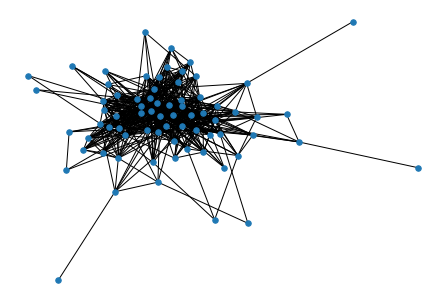

{'LCC': 72,
 'claw_count': 149220.0,
 'cpl': 1.880281690140845,
 'd': 16.444444444444443,
 'd_max': 66.0,
 'd_min': 1.0,
 'edge_num': 592,
 'gini': 0.36111111111111116,
 'n_components': 1,
 'node_num': 72,
 'power_law_exp': 1.4047061319794967,
 'rel_edge_distr_entropy': 0.9408530669866471,
 'square_count': 6172,
 'triangle_count': 2390,
 'wedge_count': 14270.0}
tensor([0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.])


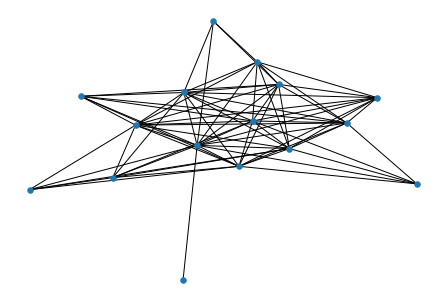

{'LCC': 16,
 'claw_count': 2147.0,
 'cpl': 1.4,
 'd': 9.0,
 'd_max': 15.0,
 'd_min': 1.0,
 'edge_num': 72,
 'gini': 0.1015625,
 'n_components': 1,
 'node_num': 16,
 'power_law_exp': 1.487510385592949,
 'rel_edge_distr_entropy': 0.9636760198696733,
 'square_count': 261,
 'triangle_count': 174,
 'wedge_count': 685.0}
tensor([0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.])


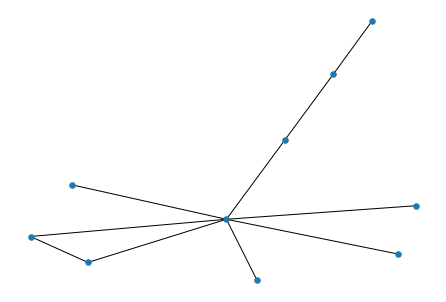

{'LCC': 10,
 'claw_count': 34.99999999999999,
 'cpl': 2.2,
 'd': 2.0,
 'd_max': 7.0,
 'd_min': 1.0,
 'edge_num': 10,
 'gini': 0.1499999999999999,
 'n_components': 1,
 'node_num': 10,
 'power_law_exp': 3.119318086698044,
 'rel_edge_distr_entropy': 0.8848119694447857,
 'square_count': 0,
 'triangle_count': 1,
 'wedge_count': 25.0}
tensor([0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0.])


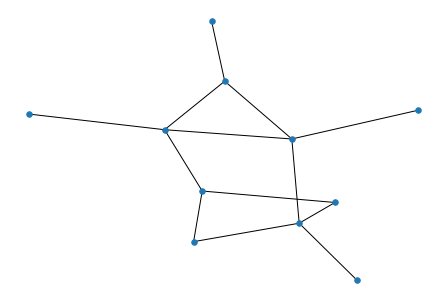

{'LCC': 11,
 'claw_count': 14.0,
 'cpl': 2.2181818181818183,
 'd': 2.3636363636363638,
 'd_max': 4.0,
 'd_min': 1.0,
 'edge_num': 13,
 'gini': 0.104895104895105,
 'n_components': 1,
 'node_num': 11,
 'power_law_exp': 2.4207477174403085,
 'rel_edge_distr_entropy': 0.9416850476998382,
 'square_count': 0,
 'triangle_count': 1,
 'wedge_count': 26.0}
tensor([0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0.])


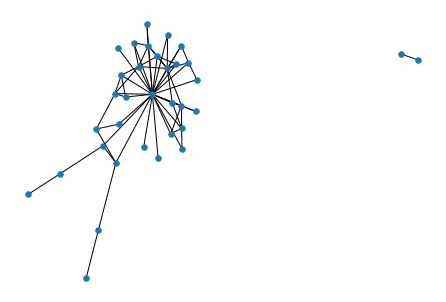

{'LCC': 32,
 'claw_count': 2848.0,
 'cpl': 2.2293762575452716,
 'd': 3.823529411764706,
 'd_max': 26.0,
 'd_min': 1.0,
 'edge_num': 65,
 'gini': 0.3719457013574661,
 'n_components': 2,
 'node_num': 34,
 'power_law_exp': 1.9798534814093034,
 'rel_edge_distr_entropy': 0.8931277157389573,
 'square_count': 13,
 'triangle_count': 43,
 'wedge_count': 504.0}
tensor([0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0.])


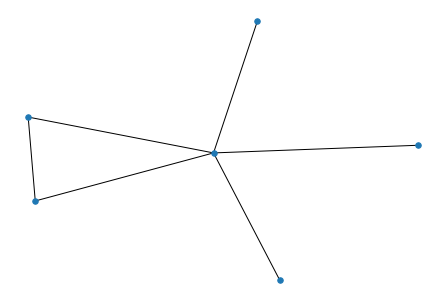

{'LCC': 6,
 'claw_count': 10.0,
 'cpl': 1.6,
 'd': 2.0,
 'd_max': 5.0,
 'd_min': 1.0,
 'edge_num': 6,
 'gini': 0.0,
 'n_components': 1,
 'node_num': 6,
 'power_law_exp': 3.0028492041720045,
 'rel_edge_distr_entropy': 0.883605466225036,
 'square_count': 0,
 'triangle_count': 1,
 'wedge_count': 12.0}
tensor([0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0.])


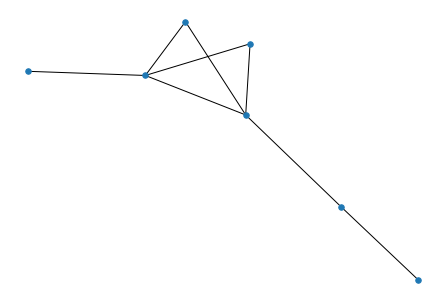

{'LCC': 7,
 'claw_count': 8.0,
 'cpl': 1.9047619047619047,
 'd': 2.2857142857142856,
 'd_max': 4.0,
 'd_min': 1.0,
 'edge_num': 8,
 'gini': -0.017857142857142794,
 'n_components': 1,
 'node_num': 7,
 'power_law_exp': 2.4426950408889634,
 'rel_edge_distr_entropy': 0.9350213837484218,
 'square_count': 0,
 'triangle_count': 2,
 'wedge_count': 15.0}
tensor([0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0.])


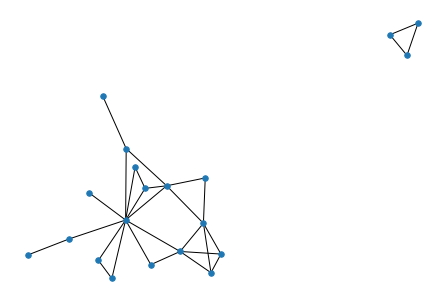

{'LCC': 17,
 'claw_count': 154.0,
 'cpl': 2.20863309352518,
 'd': 2.9,
 'd_max': 10.0,
 'd_min': 1.0,
 'edge_num': 29,
 'gini': 0.21896551724137936,
 'n_components': 2,
 'node_num': 20,
 'power_law_exp': 2.1258933014072623,
 'rel_edge_distr_entropy': 0.9362530304267763,
 'square_count': 1,
 'triangle_count': 11,
 'wedge_count': 96.0}
tensor([0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0.])


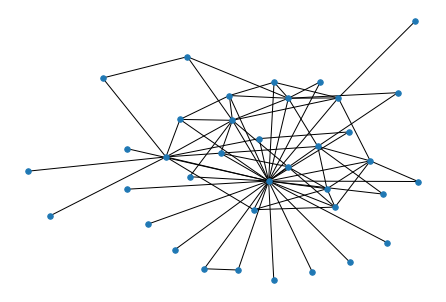

{'LCC': 37,
 'claw_count': 4488.0,
 'cpl': 2.108108108108108,
 'd': 4.0,
 'd_max': 30.0,
 'd_min': 1.0,
 'edge_num': 74,
 'gini': 0.4353542731921112,
 'n_components': 1,
 'node_num': 37,
 'power_law_exp': 2.0294713010262613,
 'rel_edge_distr_entropy': 0.8719007839079403,
 'square_count': 11,
 'triangle_count': 48,
 'wedge_count': 684.0}
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0.])
empty graph to print
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0.])


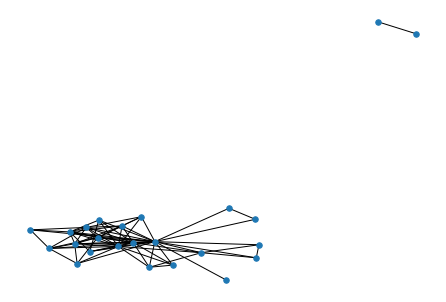

{'LCC': 22,
 'claw_count': 2620.0,
 'cpl': 1.668103448275862,
 'd': 6.416666666666667,
 'd_max': 21.0,
 'd_min': 1.0,
 'edge_num': 77,
 'gini': 0.30573593073593064,
 'n_components': 2,
 'node_num': 24,
 'power_law_exp': 1.6389288565965399,
 'rel_edge_distr_entropy': 0.9210143240810383,
 'square_count': 126,
 'triangle_count': 127,
 'wedge_count': 686.0}
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0.])


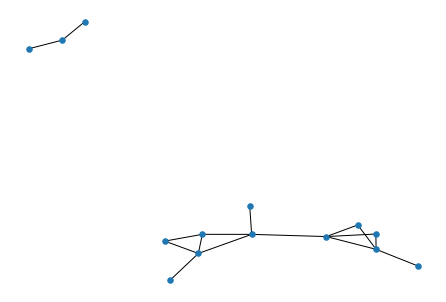

{'LCC': 11,
 'claw_count': 17.0,
 'cpl': 2.3793103448275863,
 'd': 2.2857142857142856,
 'd_max': 4.0,
 'd_min': 1.0,
 'edge_num': 16,
 'gini': 0.1473214285714286,
 'n_components': 2,
 'node_num': 14,
 'power_law_exp': 2.486771168589777,
 'rel_edge_distr_entropy': 0.9458920230062228,
 'square_count': 0,
 'triangle_count': 4,
 'wedge_count': 31.0}
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1.])
empty graph to print


In [9]:
t_adj_mats = [torch.from_numpy(m).float() for m in adj_mats]
t_attr_vecs = torch.eye(len(adj_mats))

for i in range(13):
    print(t_attr_vecs[i])
    a = t_adj_mats[i]
    show_graph(a)

In [0]:
class GraphConvolution(Module):
    """
    Simple GCN layer, similar to https://arxiv.org/abs/1609.02907
    """

    def __init__(self, in_features, out_features, bias=True):
        super(GraphConvolution, self).__init__()
        self.in_features = in_features
        self.out_features = out_features
        self.weight = Parameter(torch.FloatTensor(in_features, out_features))
        if bias:
            self.bias = Parameter(torch.FloatTensor(out_features))
        else:
            self.register_parameter('bias', None)
        self.reset_parameters()

    def reset_parameters(self):
        stdv = 1. / math.sqrt(self.weight.size(1))
        self.weight.data.uniform_(-stdv, stdv)
        if self.bias is not None:
            self.bias.data.uniform_(-stdv, stdv)

    def forward(self, input, adj):
        support = torch.mm(input, self.weight)
        output = torch.spmm(adj, support)
        if self.bias is not None:
            return output + self.bias
        else:
            return output

    def __repr__(self):
        return self.__class__.__name__ + ' (' \
               + str(self.in_features) + ' -> ' \
               + str(self.out_features) + ')'

In [0]:
class Encoder(nn.Module):
    def __init__(self, av_size, d_size, gc_size, z_size, rep_size):
        """

        :param av_size: D_A
        :param d_size: D_X
        :param gc_size: D'
        :param z_size: z
        """
        super(Encoder, self).__init__()
        # input parameters
        self.z_size = z_size
        self.attr_vec = None
        self.gc_size = gc_size
        self.z_size = z_size
        self.d_size = d_size
        self.av_size = av_size
        self.rep_size = rep_size
        
        self.gc = GraphConvolution(d_size + av_size, gc_size)
        self.gc_mu = GraphConvolution(gc_size, z_size)
        self.gc_logvar = GraphConvolution(gc_size, z_size)
        
        self.mean = nn.Sequential( nn.Linear(gc_size, z_size))

        self.logvar = nn.Sequential(nn.Linear(gc_size, z_size)) #nn.ReLU(),
     
    def set_attr_vec(self, attr_vec):
        self.attr_vec = attr_vec

    def forward(self, adj):
        x = get_spectral_embedding(adj, d=self.d_size)
        adj = normalize(adj)
        x = cat_attr(x, self.attr_vec)
        x = F.relu(self.gc(x, adj))
        
        z_mean = self.gc_mu(x, adj)
        z_logvar = self.gc_logvar(x, adj)
        
        x = F.dropout(x, p=0.5)
        # create graph embedding N*D' -> 1*D'
        # x = x.sum(0)
        #z_mean = self.mean(x)
        #z_logvar = self.logvar(x)
        
        # feature III here
        z_mean = torch.mean(z_mean, 0)
        z_mean = z_mean.repeat(z_logvar.shape[0], 1)

        return z_mean, z_logvar

In [0]:
class Decoder(nn.Module):
    def __init__(self, z_out_size):
        """
        :param z_out_size: = z_size + len(attr_vec)
        """
        super(Decoder, self).__init__()
        self.z_out_size = z_out_size

        self.decode = nn.Sequential(
            nn.Linear(z_out_size, 4),
            nn.ReLU())

    def forward(self, z):
        #x = self.decode(z)
        x = z
        x = torch.mm(x, x.t())
        #x = F.sigmoid(x)
        return x

In [0]:
class Generator(nn.Module):
    def __init__(self, av_size, d_size, gc_size, z_size, z_out_size, rep_size):
        """

        :param av_size: D_A
        :param d_size: D_X
        :param gc_size: D' = GCN(D_X + D_A)
        :param z_size: original z size
        :param z_out_size: z size + D_A (append attribute)
        """
        super(Generator, self).__init__()
        self.attr_vec = None
        self.av_size = av_size
        self.d_zize = d_size
        self.z_size = z_size
        self.z_out_size = z_out_size
        self.rep_size = rep_size

        self.encoder = Encoder(av_size, d_size, gc_size, z_size, rep_size)
        self.decoder = Decoder(z_out_size)
    
    def set_attr_vec(self, attr_vec):
        self.attr_vec = attr_vec
        self.encoder.set_attr_vec(attr_vec)
   
    def forward(self, adj):
        mean, logvar = self.encoder(adj)
        std = logvar.mul(0.5).exp_()
        reparametrized_noise = torch.randn(mean.shape, requires_grad=True).cuda()
        reparametrized_noise = mean + std * reparametrized_noise
        
        x = cat_attr(reparametrized_noise, self.attr_vec)
        rec_x = self.decoder(x)
        return mean, logvar, rec_x

In [0]:
class Discriminator(nn.Module):
    def __init__(self, av_size, d_size, gc_size):
        super(Discriminator, self).__init__()
        self.av_size = av_size
        self.attr_vec = None
        self.d_size = d_size
        self.gc_size = gc_size

        self.gc = GraphConvolution(d_size + av_size, gc_size)
        self.gc2 = GraphConvolution(gc_size, 8)
        
        self.main = nn.Sequential(
            nn.Linear(gc_size, 16),
            nn.LeakyReLU(0.2),
            nn.Linear(16, 8),
            nn.LeakyReLU(0.2),
        )

        self.sigmoid_output = nn.Sequential(
            nn.Linear(8, 1),
            nn.Sigmoid())
    
    def set_attr_vec(self, attr_vec):
        self.attr_vec = attr_vec

    def forward(self, adj):
        # get spectral embedding from adj, D = D_X
        x = get_spectral_embedding(adj, d=self.d_size)
        adj = normalize(adj)
        x = cat_attr(x, self.attr_vec)

        # GCN layer N*D -> N*D'
        x = F.relu(self.gc(x, adj))
        # x = F.relu(self.gc2(x, adj))
        
        # x = F.dropout(x, p=0.5)
        x = self.main(x)
        x = x.sum(0)
        
        x = self.sigmoid_output(x)

        return x

    def similarity(self, adj):
        # get spectral embedding from adj, D = D_X
        x = get_spectral_embedding(adj, d=self.d_size)
        
        # norm adj
        adj = normalize(adj)

        # concatenate attr mat, D = D_X + D_A
        x = cat_attr(x, self.attr_vec)

        # GCN layer N*D -> N*D'
        x = F.relu(self.gc(x, adj))
        x = F.dropout(x, p=0.5)
        #x = F.relu(self.gc2(x, adj))
        # create graph embedding N*D' -> 1*D'
        x = self.main(x)
        # x = x.sum(0)
        # skip the last sigmoid layer
        # x = self.main(x)
        
        return x

In [0]:
def sample_adj(adj):
    adj_sample = adj.data.cpu()
    for i in range(adj.size(0)):
        for j in range(adj.size(1)):
            a = torch.bernoulli(adj.data[i, j])
            adj_sample[i, j] = a
    adj_sample = torch.min(adj_sample, adj_sample.t())
    return adj_sample.cuda()

opt_vae <generator object Module.parameters at 0x7f1aa012e150>
[0/2000]: vae_loss:26.2419, prior_loss:0.9941
ADJ w/o sigmoid tensor([[16.8737,  6.5612,  0.4152,  ...,  0.5870, -4.8878,  2.5029],
        [ 6.5612,  9.6018, -2.4578,  ...,  5.1218,  0.5609,  0.2629],
        [ 0.4152, -2.4578, 13.6552,  ..., -8.0590, -0.1267,  6.9938],
        ...,
        [ 0.5870,  5.1218, -8.0590,  ..., 20.1800,  4.0590, -9.7201],
        [-4.8878,  0.5609, -0.1267,  ...,  4.0590, 21.1935, -8.4095],
        [ 2.5029,  0.2629,  6.9938,  ..., -9.7201, -8.4095, 25.1917]],
       grad_fn=<CopyBackwards>)
ADJ w/ sigmoid tensor([[1.0000e+00, 9.9859e-01, 6.0234e-01,  ..., 6.4269e-01, 7.4814e-03,
         9.2434e-01],
        [9.9859e-01, 9.9993e-01, 7.8868e-02,  ..., 9.9407e-01, 6.3667e-01,
         5.6535e-01],
        [6.0234e-01, 7.8868e-02, 1.0000e+00,  ..., 3.1613e-04, 4.6837e-01,
         9.9908e-01],
        ...,
        [6.4269e-01, 9.9407e-01, 3.1613e-04,  ..., 1.0000e+00, 9.8303e-01,
         6.0059

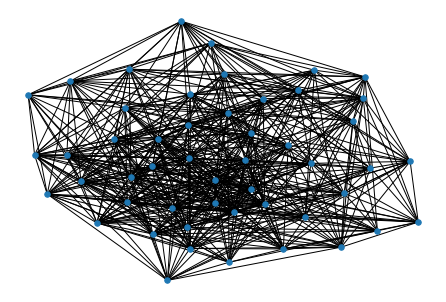

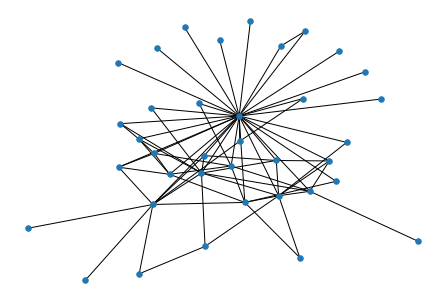

[50/2000]: vae_loss:24.5563, prior_loss:0.7244
ADJ w/o sigmoid tensor([[20.0404,  2.4665, 10.3827,  ...,  8.0284, -8.6019,  3.6719],
        [ 2.4665,  4.5975,  4.8740,  ...,  1.9386, -0.3695,  1.9957],
        [10.3827,  4.8740, 21.5748,  ...,  2.9197, -5.5057,  1.6539],
        ...,
        [ 8.0284,  1.9386,  2.9197,  ..., 23.5694, -1.3176,  6.9714],
        [-8.6019, -0.3695, -5.5057,  ..., -1.3176, 13.0582, -3.4435],
        [ 3.6719,  1.9957,  1.6539,  ...,  6.9714, -3.4435, 10.7273]],
       grad_fn=<CopyBackwards>)
ADJ w/ sigmoid tensor([[1.0000e+00, 9.2176e-01, 9.9997e-01,  ..., 9.9967e-01, 1.8373e-04,
         9.7520e-01],
        [9.2176e-01, 9.9002e-01, 9.9242e-01,  ..., 8.7420e-01, 4.0867e-01,
         8.8035e-01],
        [9.9997e-01, 9.9242e-01, 1.0000e+00,  ..., 9.4881e-01, 4.0469e-03,
         8.3942e-01],
        ...,
        [9.9967e-01, 8.7420e-01, 9.4881e-01,  ..., 1.0000e+00, 2.1122e-01,
         9.9906e-01],
        [1.8373e-04, 4.0867e-01, 4.0469e-03,  ..., 2.11

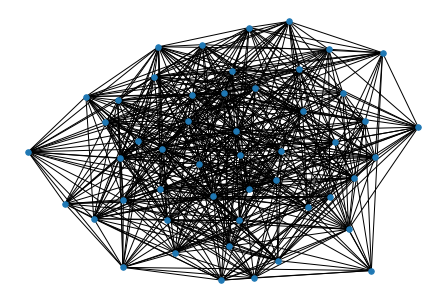

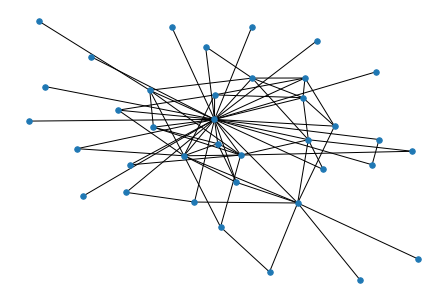

[100/2000]: vae_loss:19.3706, prior_loss:0.6432
ADJ w/o sigmoid tensor([[17.6901,  0.1627, -2.9697,  ...,  0.7928,  1.9952,  8.8076],
        [ 0.1627, 12.6239,  1.7967,  ...,  2.7919,  1.0670, -3.0587],
        [-2.9697,  1.7967, 14.3641,  ..., -3.0258, -7.5360,  0.0744],
        ...,
        [ 0.7928,  2.7919, -3.0258,  ..., 11.7787,  0.0380,  0.9173],
        [ 1.9952,  1.0670, -7.5360,  ...,  0.0380,  9.1944, -0.6783],
        [ 8.8076, -3.0587,  0.0744,  ...,  0.9173, -0.6783, 20.0135]],
       grad_fn=<CopyBackwards>)
ADJ w/ sigmoid tensor([[1.0000e+00, 5.4059e-01, 4.8811e-02,  ..., 6.8843e-01, 8.8029e-01,
         9.9985e-01],
        [5.4059e-01, 1.0000e+00, 8.5775e-01,  ..., 9.4224e-01, 7.4403e-01,
         4.4842e-02],
        [4.8811e-02, 8.5775e-01, 1.0000e+00,  ..., 4.6275e-02, 5.3323e-04,
         5.1858e-01],
        ...,
        [6.8843e-01, 9.4224e-01, 4.6275e-02,  ..., 9.9999e-01, 5.0949e-01,
         7.1449e-01],
        [8.8029e-01, 7.4403e-01, 5.3323e-04,  ..., 5.0

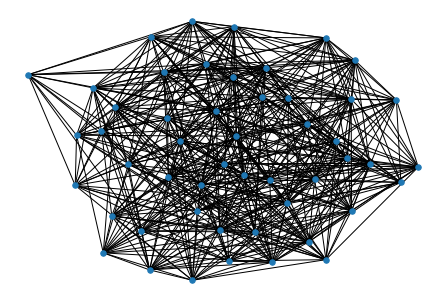

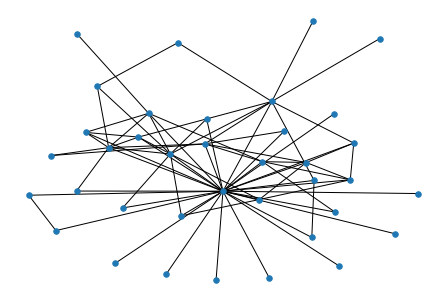

[150/2000]: vae_loss:19.0940, prior_loss:0.6014
ADJ w/o sigmoid tensor([[ 5.8187, -2.9630,  3.9096,  ...,  4.5756,  1.3401, -2.4765],
        [-2.9630, 13.8497,  1.0091,  ..., -1.2605, -5.4153,  3.8607],
        [ 3.9096,  1.0091, 22.5441,  ..., -1.9016,  6.3898, -4.6655],
        ...,
        [ 4.5756, -1.2605, -1.9016,  ..., 34.5863, -2.8511,  1.6354],
        [ 1.3401, -5.4153,  6.3898,  ..., -2.8511, 25.0364, -1.7248],
        [-2.4765,  3.8607, -4.6655,  ...,  1.6354, -1.7248,  6.6056]],
       grad_fn=<CopyBackwards>)
ADJ w/ sigmoid tensor([[0.9970, 0.0491, 0.9803,  ..., 0.9898, 0.7925, 0.0775],
        [0.0491, 1.0000, 0.7328,  ..., 0.2209, 0.0044, 0.9794],
        [0.9803, 0.7328, 1.0000,  ..., 0.1299, 0.9983, 0.0093],
        ...,
        [0.9898, 0.2209, 0.1299,  ..., 1.0000, 0.0546, 0.8369],
        [0.7925, 0.0044, 0.9983,  ..., 0.0546, 1.0000, 0.1513],
        [0.0775, 0.9794, 0.0093,  ..., 0.8369, 0.1513, 0.9986]],
       grad_fn=<CopyBackwards>)


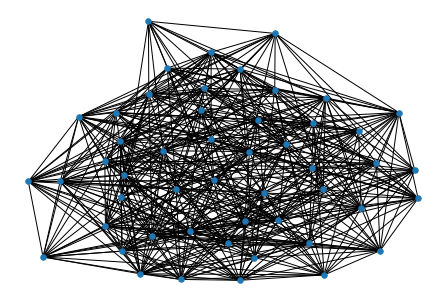

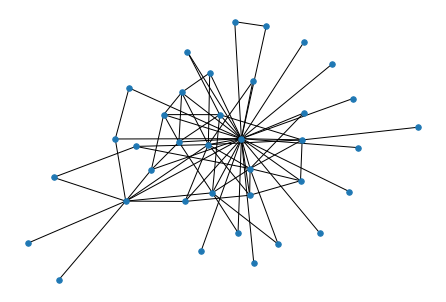

[200/2000]: vae_loss:21.7652, prior_loss:0.5732
ADJ w/o sigmoid tensor([[ 13.9027, -10.4318,  -0.4471,  ...,  -1.3759,   0.6877,   2.4666],
        [-10.4318,  22.4350,   1.5221,  ...,  -0.7144,  -5.0381,  -1.1075],
        [ -0.4471,   1.5221,  20.8729,  ...,   1.7266,   3.8107,  -2.8162],
        ...,
        [ -1.3759,  -0.7144,   1.7266,  ...,  19.8485,   2.6125,   4.2558],
        [  0.6877,  -5.0381,   3.8107,  ...,   2.6125,  21.1761,   6.5711],
        [  2.4666,  -1.1075,  -2.8162,  ...,   4.2558,   6.5711,  10.2857]],
       grad_fn=<CopyBackwards>)
ADJ w/ sigmoid tensor([[1.0000e+00, 2.9478e-05, 3.9006e-01,  ..., 2.0167e-01, 6.6546e-01,
         9.2176e-01],
        [2.9478e-05, 1.0000e+00, 8.2085e-01,  ..., 3.2863e-01, 6.4441e-03,
         2.4834e-01],
        [3.9006e-01, 8.2085e-01, 1.0000e+00,  ..., 8.4897e-01, 9.7835e-01,
         5.6455e-02],
        ...,
        [2.0167e-01, 3.2863e-01, 8.4897e-01,  ..., 1.0000e+00, 9.3166e-01,
         9.8602e-01],
        [6.6546e-0

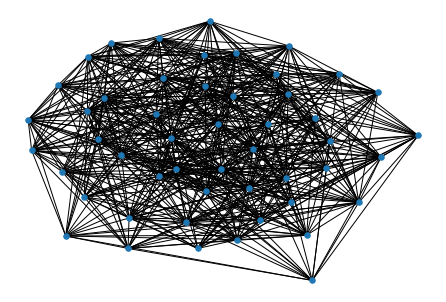

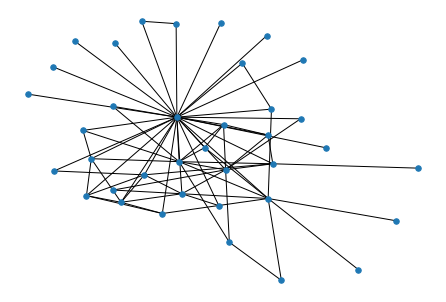

[250/2000]: vae_loss:18.3971, prior_loss:0.5676
ADJ w/o sigmoid tensor([[13.1452, 10.1864,  0.4026,  ...,  2.9485, -1.0848, -1.1105],
        [10.1864, 18.6986,  2.4215,  ...,  0.9455, -0.9604, -1.0374],
        [ 0.4026,  2.4215,  9.7060,  ...,  5.0185,  1.9301,  3.3404],
        ...,
        [ 2.9485,  0.9455,  5.0185,  ..., 23.9686,  2.7418,  5.6342],
        [-1.0848, -0.9604,  1.9301,  ...,  2.7418, 10.0067,  2.0172],
        [-1.1105, -1.0374,  3.3404,  ...,  5.6342,  2.0172, 19.1510]],
       grad_fn=<CopyBackwards>)
ADJ w/ sigmoid tensor([[1.0000, 1.0000, 0.5993,  ..., 0.9502, 0.2526, 0.2478],
        [1.0000, 1.0000, 0.9185,  ..., 0.7202, 0.2768, 0.2616],
        [0.5993, 0.9185, 0.9999,  ..., 0.9934, 0.8733, 0.9658],
        ...,
        [0.9502, 0.7202, 0.9934,  ..., 1.0000, 0.9394, 0.9964],
        [0.2526, 0.2768, 0.8733,  ..., 0.9394, 1.0000, 0.8826],
        [0.2478, 0.2616, 0.9658,  ..., 0.9964, 0.8826, 1.0000]],
       grad_fn=<CopyBackwards>)


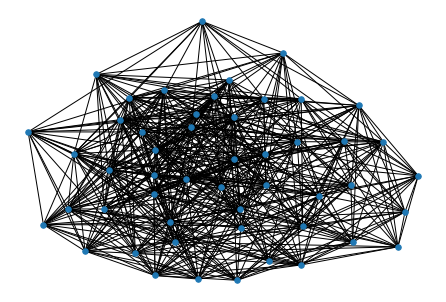

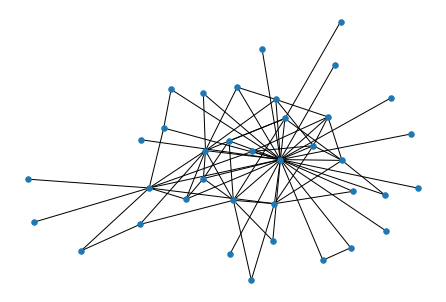

[300/2000]: vae_loss:16.2177, prior_loss:0.5795
ADJ w/o sigmoid tensor([[21.6076,  1.9418,  5.9799,  ...,  3.4364, -0.3652, -2.4152],
        [ 1.9418,  8.4761,  3.1105,  ..., -1.3511,  3.7293, -2.7173],
        [ 5.9799,  3.1105, 10.1938,  ...,  1.4886,  0.2993, -4.3406],
        ...,
        [ 3.4364, -1.3511,  1.4886,  ...,  7.2045, -0.4854, -1.0249],
        [-0.3652,  3.7293,  0.2993,  ..., -0.4854, 12.8768,  5.4428],
        [-2.4152, -2.7173, -4.3406,  ..., -1.0249,  5.4428, 12.2512]],
       grad_fn=<CopyBackwards>)
ADJ w/ sigmoid tensor([[1.0000, 0.8745, 0.9975,  ..., 0.9688, 0.4097, 0.0820],
        [0.8745, 0.9998, 0.9573,  ..., 0.2057, 0.9766, 0.0620],
        [0.9975, 0.9573, 1.0000,  ..., 0.8159, 0.5743, 0.0129],
        ...,
        [0.9688, 0.2057, 0.8159,  ..., 0.9993, 0.3810, 0.2641],
        [0.4097, 0.9766, 0.5743,  ..., 0.3810, 1.0000, 0.9957],
        [0.0820, 0.0620, 0.0129,  ..., 0.2641, 0.9957, 1.0000]],
       grad_fn=<CopyBackwards>)


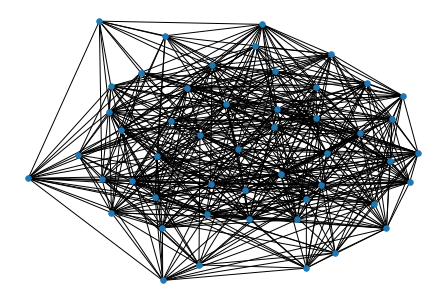

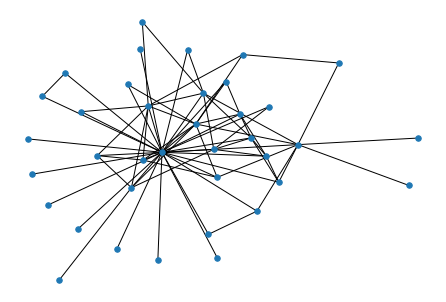

[350/2000]: vae_loss:14.5832, prior_loss:0.6082
ADJ w/o sigmoid tensor([[13.7138,  5.4375, -1.4651,  ...,  2.1666, -0.8767, -3.6019],
        [ 5.4375, 19.8181,  6.9742,  ..., -1.4001, -1.8593, -0.9113],
        [-1.4651,  6.9742, 13.3412,  ..., -6.9724,  3.6839,  3.3521],
        ...,
        [ 2.1666, -1.4001, -6.9724,  ..., 13.3496,  2.4265, -1.4037],
        [-0.8767, -1.8593,  3.6839,  ...,  2.4265,  9.8892,  0.6728],
        [-3.6019, -0.9113,  3.3521,  ..., -1.4037,  0.6728, 11.5169]],
       grad_fn=<CopyBackwards>)
ADJ w/ sigmoid tensor([[1.0000e+00, 9.9567e-01, 1.8769e-01,  ..., 8.9721e-01, 2.9386e-01,
         2.6549e-02],
        [9.9567e-01, 1.0000e+00, 9.9907e-01,  ..., 1.9780e-01, 1.3478e-01,
         2.8673e-01],
        [1.8769e-01, 9.9907e-01, 1.0000e+00,  ..., 9.3653e-04, 9.7549e-01,
         9.6617e-01],
        ...,
        [8.9721e-01, 1.9780e-01, 9.3653e-04,  ..., 1.0000e+00, 9.1883e-01,
         1.9723e-01],
        [2.9386e-01, 1.3478e-01, 9.7549e-01,  ..., 9.1

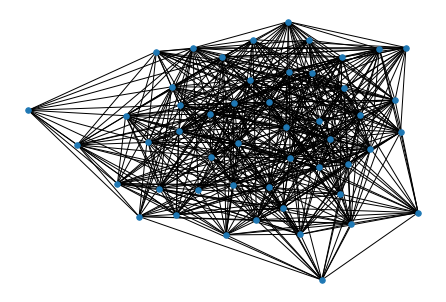

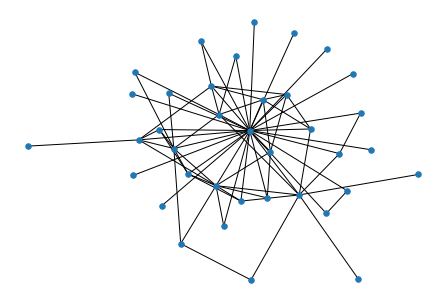

[400/2000]: vae_loss:20.7209, prior_loss:0.6462
ADJ w/o sigmoid tensor([[10.6435, -1.1146, -1.2691,  ...,  5.4020,  3.0049, -7.3543],
        [-1.1146, 15.7978,  1.6814,  ...,  5.5797,  0.7101, -3.0598],
        [-1.2691,  1.6814, 12.4861,  ...,  3.8101,  1.7604, -8.6751],
        ...,
        [ 5.4020,  5.5797,  3.8101,  ..., 12.1843,  0.6091, -8.1280],
        [ 3.0049,  0.7101,  1.7604,  ...,  0.6091, 18.6699, -5.6343],
        [-7.3543, -3.0598, -8.6751,  ..., -8.1280, -5.6343, 19.4223]],
       grad_fn=<CopyBackwards>)
ADJ w/ sigmoid tensor([[9.9998e-01, 2.4702e-01, 2.1942e-01,  ..., 9.9551e-01, 9.5279e-01,
         6.3945e-04],
        [2.4702e-01, 1.0000e+00, 8.4309e-01,  ..., 9.9624e-01, 6.7043e-01,
         4.4794e-02],
        [2.1942e-01, 8.4309e-01, 1.0000e+00,  ..., 9.7833e-01, 8.5326e-01,
         1.7075e-04],
        ...,
        [9.9551e-01, 9.9624e-01, 9.7833e-01,  ..., 9.9999e-01, 6.4772e-01,
         2.9506e-04],
        [9.5279e-01, 6.7043e-01, 8.5326e-01,  ..., 6.4

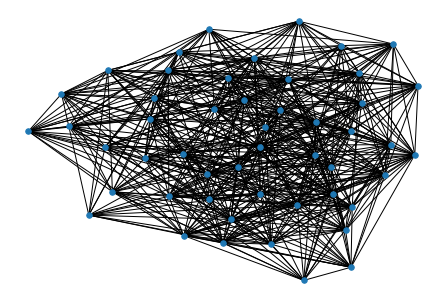

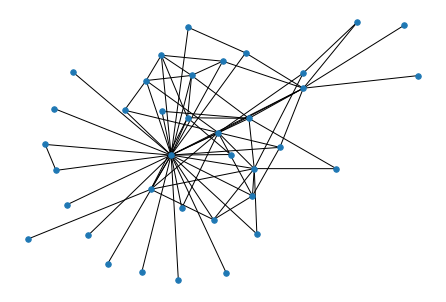

[450/2000]: vae_loss:17.6021, prior_loss:0.7067
ADJ w/o sigmoid tensor([[12.6156,  1.7857,  2.4013,  ..., -1.2731, -3.5998, -2.9513],
        [ 1.7857, 14.6285,  4.5278,  ...,  0.8594, -3.9174, -6.4458],
        [ 2.4013,  4.5278, 14.7007,  ..., -3.7695, -4.9595, -3.4957],
        ...,
        [-1.2731,  0.8594, -3.7695,  ...,  7.1173, -2.5867, -2.8067],
        [-3.5998, -3.9174, -4.9595,  ..., -2.5867, 13.0132,  6.4589],
        [-2.9513, -6.4458, -3.4957,  ..., -2.8067,  6.4589,  9.9072]],
       grad_fn=<CopyBackwards>)
ADJ w/ sigmoid tensor([[1.0000, 0.8564, 0.9169,  ..., 0.2187, 0.0266, 0.0497],
        [0.8564, 1.0000, 0.9893,  ..., 0.7025, 0.0195, 0.0016],
        [0.9169, 0.9893, 1.0000,  ..., 0.0225, 0.0070, 0.0294],
        ...,
        [0.2187, 0.7025, 0.0225,  ..., 0.9992, 0.0700, 0.0570],
        [0.0266, 0.0195, 0.0070,  ..., 0.0700, 1.0000, 0.9984],
        [0.0497, 0.0016, 0.0294,  ..., 0.0570, 0.9984, 1.0000]],
       grad_fn=<CopyBackwards>)


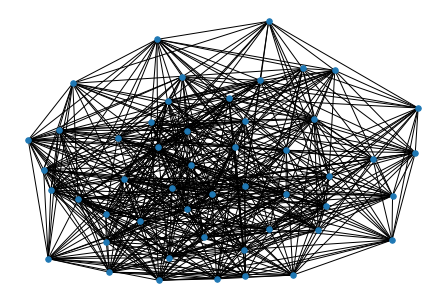

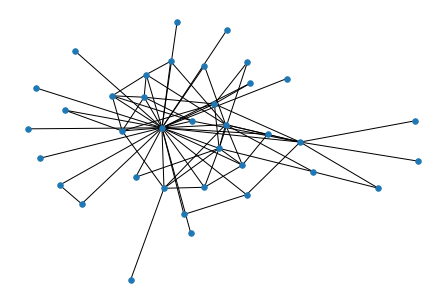

[500/2000]: vae_loss:13.7604, prior_loss:0.7832
ADJ w/o sigmoid tensor([[12.1004, -1.1181,  2.0960,  ..., -3.9669, -3.0646,  2.0331],
        [-1.1181, 11.5569, -4.1542,  ...,  4.9530,  4.7303, -0.9733],
        [ 2.0960, -4.1542, 10.6514,  ..., -3.4807, -0.2976,  4.4858],
        ...,
        [-3.9669,  4.9530, -3.4807,  ...,  8.5984,  0.4414, -0.7477],
        [-3.0646,  4.7303, -0.2976,  ...,  0.4414, 19.4586, -4.0039],
        [ 2.0331, -0.9733,  4.4858,  ..., -0.7477, -4.0039,  7.3022]],
       grad_fn=<CopyBackwards>)
ADJ w/ sigmoid tensor([[1.0000, 0.2464, 0.8905,  ..., 0.0186, 0.0446, 0.8842],
        [0.2464, 1.0000, 0.0155,  ..., 0.9930, 0.9913, 0.2742],
        [0.8905, 0.0155, 1.0000,  ..., 0.0299, 0.4262, 0.9889],
        ...,
        [0.0186, 0.9930, 0.0299,  ..., 0.9998, 0.6086, 0.3213],
        [0.0446, 0.9913, 0.4262,  ..., 0.6086, 1.0000, 0.0179],
        [0.8842, 0.2742, 0.9889,  ..., 0.3213, 0.0179, 0.9993]],
       grad_fn=<CopyBackwards>)


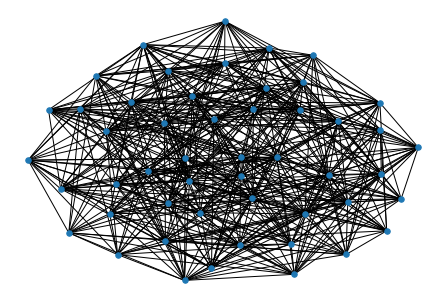

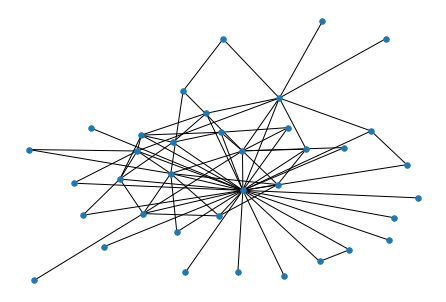

[550/2000]: vae_loss:14.1335, prior_loss:0.8729
ADJ w/o sigmoid tensor([[11.6056, -2.2507,  0.7901,  ..., -1.1842,  2.3093,  3.8137],
        [-2.2507, 11.2802, -1.0598,  ...,  4.0864,  0.9172, -0.2936],
        [ 0.7901, -1.0598, 12.8538,  ...,  0.1511,  2.0981,  3.0107],
        ...,
        [-1.1842,  4.0864,  0.1511,  ..., 15.2137,  6.2924,  4.4749],
        [ 2.3093,  0.9172,  2.0981,  ...,  6.2924,  9.2257,  4.9076],
        [ 3.8137, -0.2936,  3.0107,  ...,  4.4749,  4.9076, 11.6251]],
       grad_fn=<CopyBackwards>)
ADJ w/ sigmoid tensor([[1.0000, 0.0953, 0.6879,  ..., 0.2343, 0.9096, 0.9784],
        [0.0953, 1.0000, 0.2573,  ..., 0.9835, 0.7145, 0.4271],
        [0.6879, 0.2573, 1.0000,  ..., 0.5377, 0.8907, 0.9531],
        ...,
        [0.2343, 0.9835, 0.5377,  ..., 1.0000, 0.9982, 0.9887],
        [0.9096, 0.7145, 0.8907,  ..., 0.9982, 0.9999, 0.9927],
        [0.9784, 0.4271, 0.9531,  ..., 0.9887, 0.9927, 1.0000]],
       grad_fn=<CopyBackwards>)


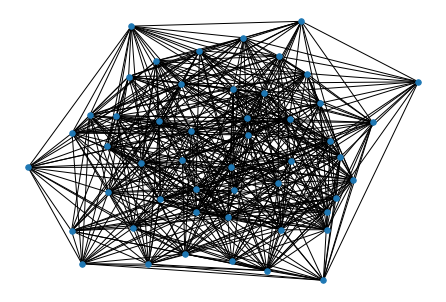

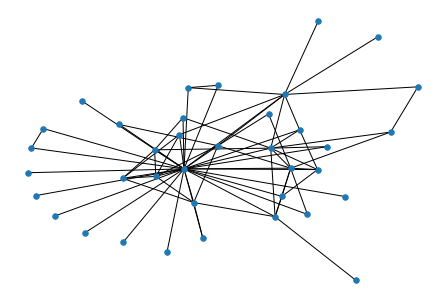

[600/2000]: vae_loss:16.0913, prior_loss:0.9775
ADJ w/o sigmoid tensor([[12.2707, -4.6080, -1.0602,  ..., -1.2007,  5.1047, -0.5301],
        [-4.6080,  9.5720,  2.8107,  ..., -0.8071,  0.9965,  0.4921],
        [-1.0602,  2.8107, 17.5107,  ..., -5.4563, -1.2727,  5.0460],
        ...,
        [-1.2007, -0.8071, -5.4563,  ..., 16.8862, -3.8400,  6.1167],
        [ 5.1047,  0.9965, -1.2727,  ..., -3.8400, 11.9286, -1.7512],
        [-0.5301,  0.4921,  5.0460,  ...,  6.1167, -1.7512, 14.5040]],
       grad_fn=<CopyBackwards>)
ADJ w/ sigmoid tensor([[1.0000, 0.0099, 0.2573,  ..., 0.2313, 0.9940, 0.3705],
        [0.0099, 0.9999, 0.9433,  ..., 0.3085, 0.7304, 0.6206],
        [0.2573, 0.9433, 1.0000,  ..., 0.0043, 0.2188, 0.9936],
        ...,
        [0.2313, 0.3085, 0.0043,  ..., 1.0000, 0.0210, 0.9978],
        [0.9940, 0.7304, 0.2188,  ..., 0.0210, 1.0000, 0.1479],
        [0.3705, 0.6206, 0.9936,  ..., 0.9978, 0.1479, 1.0000]],
       grad_fn=<CopyBackwards>)


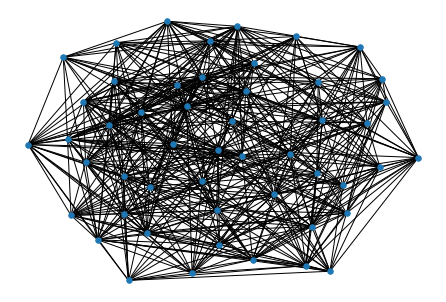

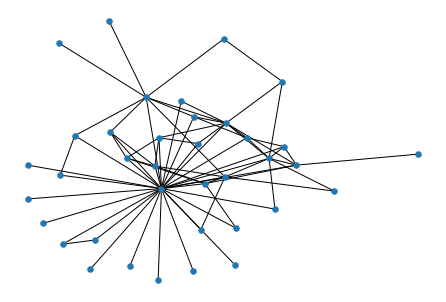

[650/2000]: vae_loss:14.2670, prior_loss:1.1015
ADJ w/o sigmoid tensor([[12.6225, -5.5211, -3.7065,  ...,  1.6747, -1.8026, -1.1786],
        [-5.5211, 15.7907, -1.7385,  ..., -2.2998,  2.3758,  3.4891],
        [-3.7065, -1.7385, 12.1553,  ...,  1.9498,  1.2209, -6.8163],
        ...,
        [ 1.6747, -2.2998,  1.9498,  ...,  7.2506,  1.7105, -2.3153],
        [-1.8026,  2.3758,  1.2209,  ...,  1.7105,  9.8934, -1.5990],
        [-1.1786,  3.4891, -6.8163,  ..., -2.3153, -1.5990, 16.8140]],
       grad_fn=<CopyBackwards>)
ADJ w/ sigmoid tensor([[1.0000, 0.0040, 0.0240,  ..., 0.8422, 0.1415, 0.2353],
        [0.0040, 1.0000, 0.1495,  ..., 0.0911, 0.9150, 0.9704],
        [0.0240, 0.1495, 1.0000,  ..., 0.8754, 0.7722, 0.0011],
        ...,
        [0.8422, 0.0911, 0.8754,  ..., 0.9993, 0.8469, 0.0899],
        [0.1415, 0.9150, 0.7722,  ..., 0.8469, 0.9999, 0.1681],
        [0.2353, 0.9704, 0.0011,  ..., 0.0899, 0.1681, 1.0000]],
       grad_fn=<CopyBackwards>)


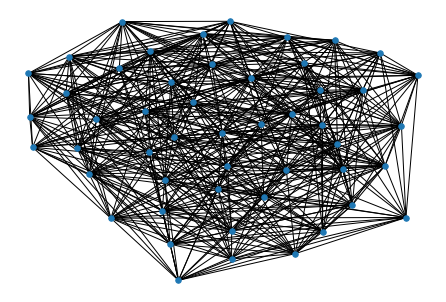

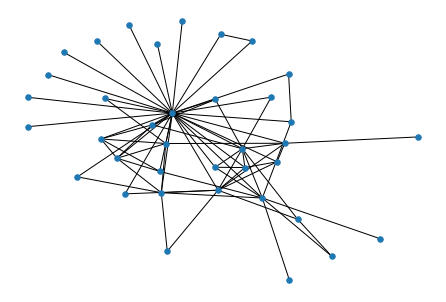

[700/2000]: vae_loss:11.8653, prior_loss:1.2391
ADJ w/o sigmoid tensor([[ 4.7055,  0.6585,  0.6148,  ...,  3.5078,  0.4400,  1.5170],
        [ 0.6585,  5.7742, -2.2469,  ...,  3.3991, -2.2166, -3.8737],
        [ 0.6148, -2.2469,  8.1748,  ..., -2.0525, -2.7976, -1.4436],
        ...,
        [ 3.5078,  3.3991, -2.0525,  ...,  9.6139, -0.4950,  1.7035],
        [ 0.4400, -2.2166, -2.7976,  ..., -0.4950, 12.6812, -1.5548],
        [ 1.5170, -3.8737, -1.4436,  ...,  1.7035, -1.5548, 16.5391]],
       grad_fn=<CopyBackwards>)
ADJ w/ sigmoid tensor([[0.9910, 0.6589, 0.6490,  ..., 0.9709, 0.6082, 0.8201],
        [0.6589, 0.9969, 0.0956,  ..., 0.9677, 0.0983, 0.0204],
        [0.6490, 0.0956, 0.9997,  ..., 0.1138, 0.0575, 0.1910],
        ...,
        [0.9709, 0.9677, 0.1138,  ..., 0.9999, 0.3787, 0.8460],
        [0.6082, 0.0983, 0.0575,  ..., 0.3787, 1.0000, 0.1744],
        [0.8201, 0.0204, 0.1910,  ..., 0.8460, 0.1744, 1.0000]],
       grad_fn=<CopyBackwards>)


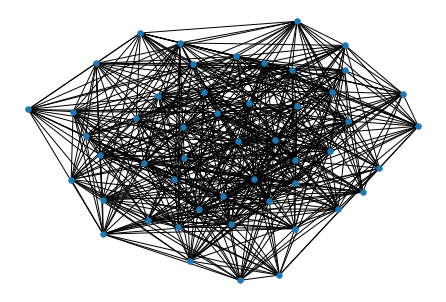

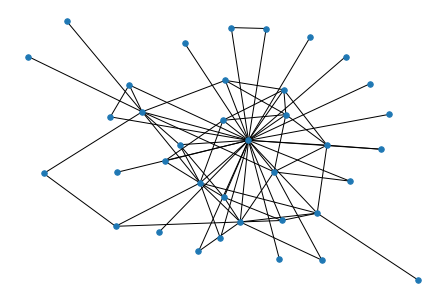

[750/2000]: vae_loss:11.8767, prior_loss:1.3930
ADJ w/o sigmoid tensor([[10.9395, -3.8313, -1.4448,  ..., -1.0498, -2.8924, -1.7029],
        [-3.8313, 18.5163,  1.9103,  ...,  6.0468,  5.8298, -1.3821],
        [-1.4448,  1.9103, 10.6692,  ..., -2.7611,  0.8347, -0.8567],
        ...,
        [-1.0498,  6.0468, -2.7611,  ...,  7.5673,  2.9869, -2.8751],
        [-2.8924,  5.8298,  0.8347,  ...,  2.9869,  8.4076, -0.2290],
        [-1.7029, -1.3821, -0.8567,  ..., -2.8751, -0.2290,  9.0915]],
       grad_fn=<CopyBackwards>)
ADJ w/ sigmoid tensor([[1.0000, 0.0212, 0.1908,  ..., 0.2593, 0.0525, 0.1541],
        [0.0212, 1.0000, 0.8711,  ..., 0.9976, 0.9971, 0.2007],
        [0.1908, 0.8711, 1.0000,  ..., 0.0595, 0.6973, 0.2980],
        ...,
        [0.2593, 0.9976, 0.0595,  ..., 0.9995, 0.9520, 0.0534],
        [0.0525, 0.9971, 0.6973,  ..., 0.9520, 0.9998, 0.4430],
        [0.1541, 0.2007, 0.2980,  ..., 0.0534, 0.4430, 0.9999]],
       grad_fn=<CopyBackwards>)


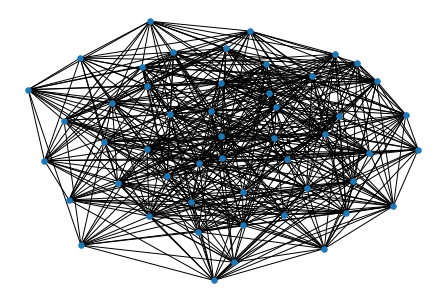

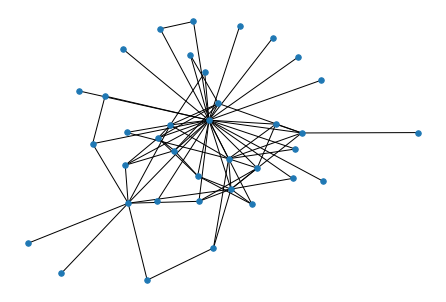

[800/2000]: vae_loss:12.4035, prior_loss:1.5593
ADJ w/o sigmoid tensor([[13.3739,  3.3133,  0.5174,  ..., -1.0895, -2.5413,  2.7648],
        [ 3.3133, 14.0709, -8.0220,  ..., -1.5008, -3.6482, -3.6874],
        [ 0.5174, -8.0220, 13.2347,  ...,  1.2584,  3.2006,  3.0636],
        ...,
        [-1.0895, -1.5008,  1.2584,  ..., 15.2920,  2.0654, -0.4407],
        [-2.5413, -3.6482,  3.2006,  ...,  2.0654, 11.0273,  2.3150],
        [ 2.7648, -3.6874,  3.0636,  ..., -0.4407,  2.3150,  8.3896]],
       grad_fn=<CopyBackwards>)
ADJ w/ sigmoid tensor([[1.0000e+00, 9.6488e-01, 6.2654e-01,  ..., 2.5172e-01, 7.3016e-02,
         9.4074e-01],
        [9.6488e-01, 1.0000e+00, 3.2804e-04,  ..., 1.8231e-01, 2.5376e-02,
         2.4425e-02],
        [6.2654e-01, 3.2804e-04, 1.0000e+00,  ..., 7.7875e-01, 9.6086e-01,
         9.5537e-01],
        ...,
        [2.5172e-01, 1.8231e-01, 7.7875e-01,  ..., 1.0000e+00, 8.8750e-01,
         3.9158e-01],
        [7.3016e-02, 2.5376e-02, 9.6086e-01,  ..., 8.8

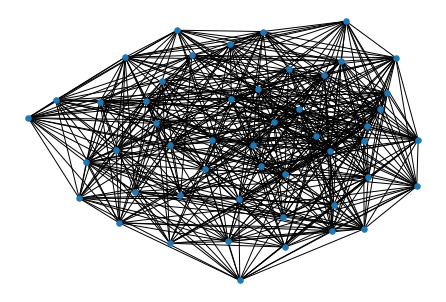

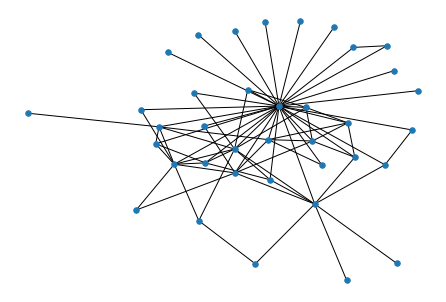

[850/2000]: vae_loss:11.8332, prior_loss:1.7373
ADJ w/o sigmoid tensor([[ 9.9717, -1.3993, -1.2996,  ..., -1.9341, -1.9337,  2.7788],
        [-1.3993,  8.6513, -2.7231,  ..., -1.2705,  1.1722,  0.4118],
        [-1.2996, -2.7231, 13.4378,  ...,  2.1794,  1.8284, -3.6063],
        ...,
        [-1.9341, -1.2705,  2.1794,  ..., 15.4501,  2.9738, -3.5237],
        [-1.9337,  1.1722,  1.8284,  ...,  2.9738, 12.5915, -2.0412],
        [ 2.7788,  0.4118, -3.6063,  ..., -3.5237, -2.0412,  5.5899]],
       grad_fn=<CopyBackwards>)
ADJ w/ sigmoid tensor([[1.0000, 0.1979, 0.2142,  ..., 0.1263, 0.1263, 0.9415],
        [0.1979, 0.9998, 0.0616,  ..., 0.2192, 0.7635, 0.6015],
        [0.2142, 0.0616, 1.0000,  ..., 0.8984, 0.8616, 0.0264],
        ...,
        [0.1263, 0.2192, 0.8984,  ..., 1.0000, 0.9514, 0.0286],
        [0.1263, 0.7635, 0.8616,  ..., 0.9514, 1.0000, 0.1149],
        [0.9415, 0.6015, 0.0264,  ..., 0.0286, 0.1149, 0.9963]],
       grad_fn=<CopyBackwards>)


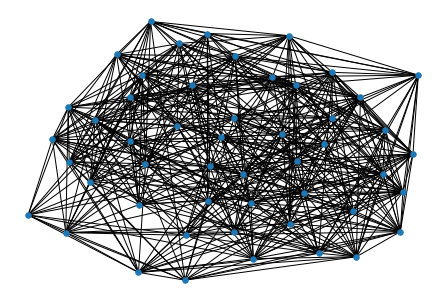

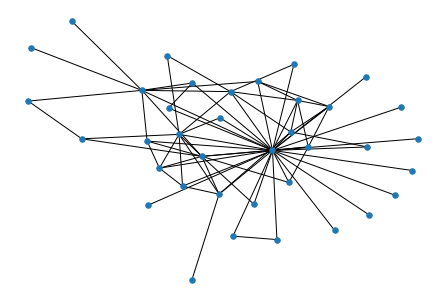

[900/2000]: vae_loss:12.4861, prior_loss:1.9228
ADJ w/o sigmoid tensor([[ 5.6205, -2.0747,  2.9670,  ...,  0.7947, -0.0968,  3.5167],
        [-2.0747, 13.8378, -1.6874,  ..., -0.7399,  2.3997, -4.9403],
        [ 2.9670, -1.6874, 11.2662,  ...,  0.8713, -1.8850,  4.0881],
        ...,
        [ 0.7947, -0.7399,  0.8713,  ..., 10.0831, -0.8618, -0.6936],
        [-0.0968,  2.3997, -1.8850,  ..., -0.8618,  8.6858,  1.1124],
        [ 3.5167, -4.9403,  4.0881,  ..., -0.6936,  1.1124, 16.1990]],
       grad_fn=<CopyBackwards>)
ADJ w/ sigmoid tensor([[0.9964, 0.1116, 0.9511,  ..., 0.6888, 0.4758, 0.9712],
        [0.1116, 1.0000, 0.1561,  ..., 0.3230, 0.9168, 0.0071],
        [0.9511, 0.1561, 1.0000,  ..., 0.7050, 0.1318, 0.9835],
        ...,
        [0.6888, 0.3230, 0.7050,  ..., 1.0000, 0.2970, 0.3332],
        [0.4758, 0.9168, 0.1318,  ..., 0.2970, 0.9998, 0.7526],
        [0.9712, 0.0071, 0.9835,  ..., 0.3332, 0.7526, 1.0000]],
       grad_fn=<CopyBackwards>)


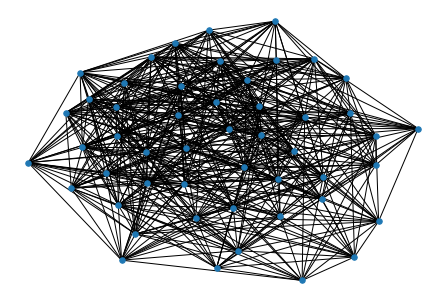

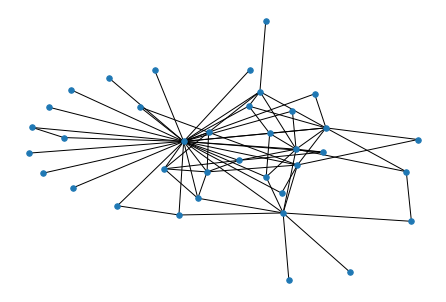

[950/2000]: vae_loss:10.5152, prior_loss:2.1245
ADJ w/o sigmoid tensor([[13.3387,  1.3696,  1.2928,  ..., -1.7101, -0.6870,  0.2406],
        [ 1.3696, 10.1022,  0.2549,  ...,  2.7330, -1.3019, -3.1457],
        [ 1.2928,  0.2549,  6.0679,  ...,  2.5255, -1.2213, -2.3243],
        ...,
        [-1.7101,  2.7330,  2.5255,  ..., 13.6735, -2.6688,  0.8645],
        [-0.6870, -1.3019, -1.2213,  ..., -2.6688,  8.7364, -3.2485],
        [ 0.2406, -3.1457, -2.3243,  ...,  0.8645, -3.2485, 14.7174]],
       grad_fn=<CopyBackwards>)
ADJ w/ sigmoid tensor([[1.0000, 0.7973, 0.7846,  ..., 0.1531, 0.3347, 0.5599],
        [0.7973, 1.0000, 0.5634,  ..., 0.9389, 0.2138, 0.0413],
        [0.7846, 0.5634, 0.9977,  ..., 0.9259, 0.2277, 0.0891],
        ...,
        [0.1531, 0.9389, 0.9259,  ..., 1.0000, 0.0648, 0.7036],
        [0.3347, 0.2138, 0.2277,  ..., 0.0648, 0.9998, 0.0374],
        [0.5599, 0.0413, 0.0891,  ..., 0.7036, 0.0374, 1.0000]],
       grad_fn=<CopyBackwards>)


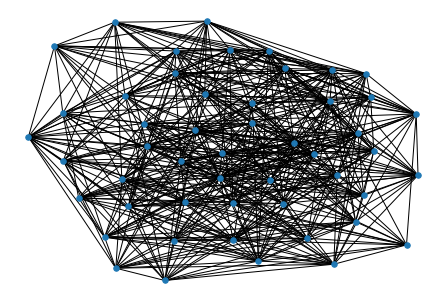

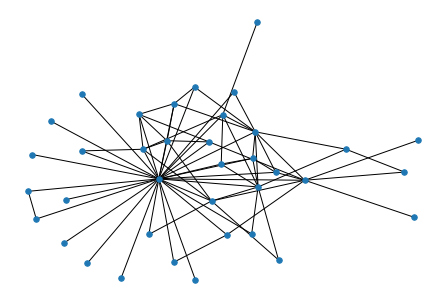

[1000/2000]: vae_loss:10.7739, prior_loss:2.3315
ADJ w/o sigmoid tensor([[ 8.4668,  0.1374, -2.0687,  ...,  0.1742,  1.0144,  0.0178],
        [ 0.1374,  5.3903,  2.1518,  ...,  2.2125, -0.7965, -1.8257],
        [-2.0687,  2.1518,  8.5232,  ...,  1.9656,  1.7851,  0.7628],
        ...,
        [ 0.1742,  2.2125,  1.9656,  ...,  8.8077,  2.0585,  0.3929],
        [ 1.0144, -0.7965,  1.7851,  ...,  2.0585, 11.8124,  1.4257],
        [ 0.0178, -1.8257,  0.7628,  ...,  0.3929,  1.4257, 10.4710]],
       grad_fn=<CopyBackwards>)
ADJ w/ sigmoid tensor([[0.9998, 0.5343, 0.1122,  ..., 0.5435, 0.7339, 0.5045],
        [0.5343, 0.9955, 0.8958,  ..., 0.9014, 0.3108, 0.1387],
        [0.1122, 0.8958, 0.9998,  ..., 0.8771, 0.8563, 0.6820],
        ...,
        [0.5435, 0.9014, 0.8771,  ..., 0.9999, 0.8868, 0.5970],
        [0.7339, 0.3108, 0.8563,  ..., 0.8868, 1.0000, 0.8062],
        [0.5045, 0.1387, 0.6820,  ..., 0.5970, 0.8062, 1.0000]],
       grad_fn=<CopyBackwards>)


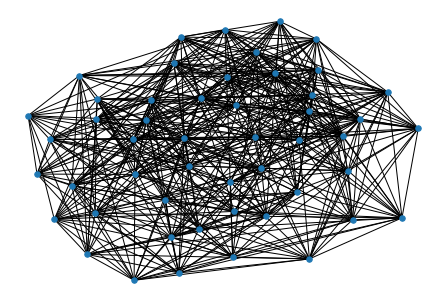

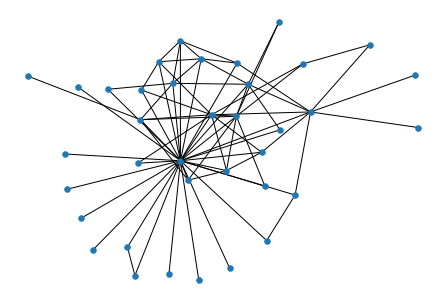

[1050/2000]: vae_loss:9.9816, prior_loss:2.5284
ADJ w/o sigmoid tensor([[11.4730, -1.7935, -4.5436,  ..., -0.9918, -3.0628, -1.2776],
        [-1.7935,  4.8092,  4.6286,  ...,  1.2893,  1.1401, -0.2401],
        [-4.5436,  4.6286, 16.8461,  ...,  0.8086,  3.2326,  0.6818],
        ...,
        [-0.9918,  1.2893,  0.8086,  ..., 11.9330, -0.0273, -1.6400],
        [-3.0628,  1.1401,  3.2326,  ..., -0.0273,  6.5962,  0.5464],
        [-1.2776, -0.2401,  0.6818,  ..., -1.6400,  0.5464,  3.7816]],
       grad_fn=<CopyBackwards>)
ADJ w/ sigmoid tensor([[1.0000, 0.1426, 0.0105,  ..., 0.2706, 0.0447, 0.2180],
        [0.1426, 0.9919, 0.9903,  ..., 0.7840, 0.7577, 0.4403],
        [0.0105, 0.9903, 1.0000,  ..., 0.6918, 0.9620, 0.6641],
        ...,
        [0.2706, 0.7840, 0.6918,  ..., 1.0000, 0.4932, 0.1625],
        [0.0447, 0.7577, 0.9620,  ..., 0.4932, 0.9986, 0.6333],
        [0.2180, 0.4403, 0.6641,  ..., 0.1625, 0.6333, 0.9777]],
       grad_fn=<CopyBackwards>)


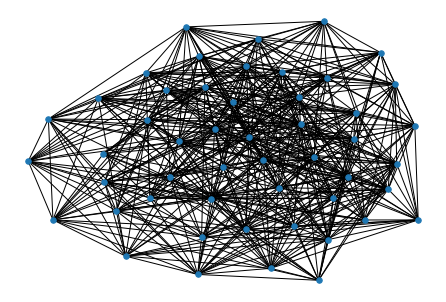

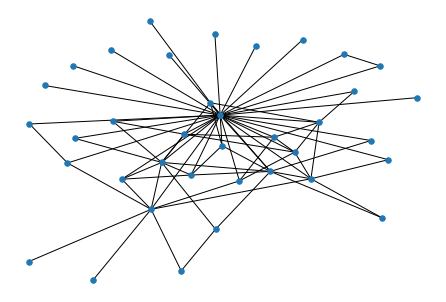

[1100/2000]: vae_loss:11.4599, prior_loss:2.7322
ADJ w/o sigmoid tensor([[16.6742, -3.5774,  2.5040,  ..., -4.7475, -0.4721, -1.0755],
        [-3.5774,  7.3235,  0.1829,  ...,  2.8482,  4.5358, -0.1447],
        [ 2.5040,  0.1829,  4.2766,  ..., -1.8888, -0.1933, -2.3859],
        ...,
        [-4.7475,  2.8482, -1.8888,  ..., 10.6661,  0.1352,  1.6534],
        [-0.4721,  4.5358, -0.1933,  ...,  0.1352,  6.1351, -1.2400],
        [-1.0755, -0.1447, -2.3859,  ...,  1.6534, -1.2400, 12.5385]],
       grad_fn=<CopyBackwards>)
ADJ w/ sigmoid tensor([[1.0000, 0.0272, 0.9244,  ..., 0.0086, 0.3841, 0.2544],
        [0.0272, 0.9993, 0.5456,  ..., 0.9452, 0.9894, 0.4639],
        [0.9244, 0.5456, 0.9863,  ..., 0.1314, 0.4518, 0.0843],
        ...,
        [0.0086, 0.9452, 0.1314,  ..., 1.0000, 0.5337, 0.8394],
        [0.3841, 0.9894, 0.4518,  ..., 0.5337, 0.9978, 0.2244],
        [0.2544, 0.4639, 0.0843,  ..., 0.8394, 0.2244, 1.0000]],
       grad_fn=<CopyBackwards>)


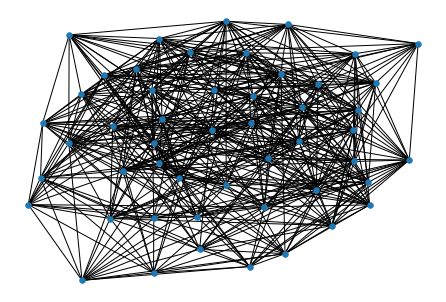

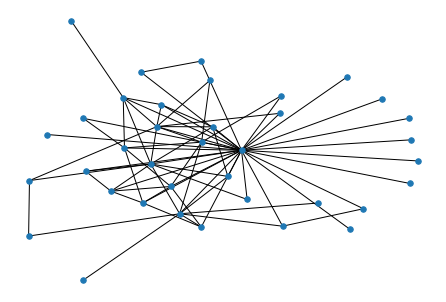

[1150/2000]: vae_loss:10.4511, prior_loss:2.9391
ADJ w/o sigmoid tensor([[ 8.6204, -0.2041, -1.3288,  ..., -1.4149, -0.3463,  4.7611],
        [-0.2041,  9.3433,  3.9368,  ...,  4.1783,  1.2278, -0.7580],
        [-1.3288,  3.9368,  8.7619,  ...,  0.2911,  3.0327, -0.5584],
        ...,
        [-1.4149,  4.1783,  0.2911,  ..., 14.1004,  4.5202,  4.7401],
        [-0.3463,  1.2278,  3.0327,  ...,  4.5202,  6.3656, -1.1070],
        [ 4.7611, -0.7580, -0.5584,  ...,  4.7401, -1.1070, 17.9553]],
       grad_fn=<CopyBackwards>)
ADJ w/ sigmoid tensor([[0.9998, 0.4491, 0.2094,  ..., 0.1955, 0.4143, 0.9915],
        [0.4491, 0.9999, 0.9809,  ..., 0.9849, 0.7734, 0.3191],
        [0.2094, 0.9809, 0.9998,  ..., 0.5723, 0.9540, 0.3639],
        ...,
        [0.1955, 0.9849, 0.5723,  ..., 1.0000, 0.9892, 0.9913],
        [0.4143, 0.7734, 0.9540,  ..., 0.9892, 0.9983, 0.2484],
        [0.9915, 0.3191, 0.3639,  ..., 0.9913, 0.2484, 1.0000]],
       grad_fn=<CopyBackwards>)


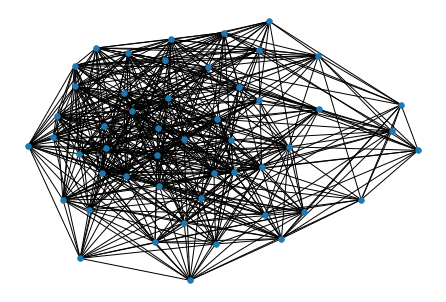

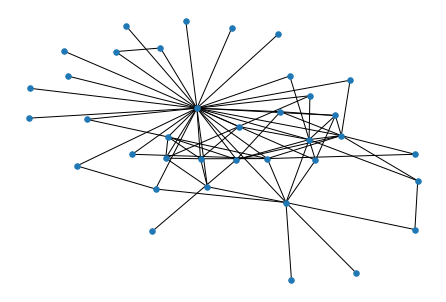

[1200/2000]: vae_loss:10.7774, prior_loss:3.1338
ADJ w/o sigmoid tensor([[ 7.1021,  0.1448, -0.9724,  ...,  2.0188,  1.5359,  0.1528],
        [ 0.1448, 11.5352, -2.2460,  ...,  6.7972,  0.3005,  4.6494],
        [-0.9724, -2.2460, 10.5984,  ...,  1.9917, -3.6174, -5.2572],
        ...,
        [ 2.0188,  6.7972,  1.9917,  ..., 15.4027, -0.6826,  0.9414],
        [ 1.5359,  0.3005, -3.6174,  ..., -0.6826,  9.9158,  0.6589],
        [ 0.1528,  4.6494, -5.2572,  ...,  0.9414,  0.6589, 14.6654]],
       grad_fn=<CopyBackwards>)
ADJ w/ sigmoid tensor([[0.9992, 0.5361, 0.2744,  ..., 0.8828, 0.8229, 0.5381],
        [0.5361, 1.0000, 0.0957,  ..., 0.9989, 0.5746, 0.9905],
        [0.2744, 0.0957, 1.0000,  ..., 0.8799, 0.0262, 0.0052],
        ...,
        [0.8828, 0.9989, 0.8799,  ..., 1.0000, 0.3357, 0.7194],
        [0.8229, 0.5746, 0.0262,  ..., 0.3357, 1.0000, 0.6590],
        [0.5381, 0.9905, 0.0052,  ..., 0.7194, 0.6590, 1.0000]],
       grad_fn=<CopyBackwards>)


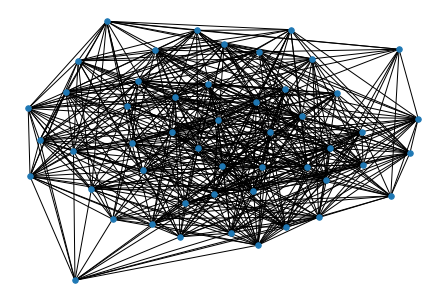

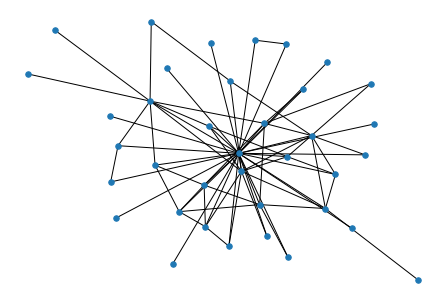

[1250/2000]: vae_loss:11.1059, prior_loss:3.3218
ADJ w/o sigmoid tensor([[10.3654,  2.0314,  2.3489,  ..., -2.1051, -1.8196, -1.4861],
        [ 2.0314,  4.2586,  0.5791,  ...,  1.3702, -0.2786, -0.1334],
        [ 2.3489,  0.5791,  8.2403,  ...,  4.1335, -4.4725, -2.9305],
        ...,
        [-2.1051,  1.3702,  4.1335,  ..., 10.8326, -2.3715,  2.6749],
        [-1.8196, -0.2786, -4.4725,  ..., -2.3715,  5.8036,  2.2254],
        [-1.4861, -0.1334, -2.9305,  ...,  2.6749,  2.2254,  9.4006]],
       grad_fn=<CopyBackwards>)
ADJ w/ sigmoid tensor([[1.0000, 0.8841, 0.9128,  ..., 0.1086, 0.1395, 0.1845],
        [0.8841, 0.9861, 0.6409,  ..., 0.7974, 0.4308, 0.4667],
        [0.9128, 0.6409, 0.9997,  ..., 0.9842, 0.0113, 0.0507],
        ...,
        [0.1086, 0.7974, 0.9842,  ..., 1.0000, 0.0854, 0.9355],
        [0.1395, 0.4308, 0.0113,  ..., 0.0854, 0.9970, 0.9025],
        [0.1845, 0.4667, 0.0507,  ..., 0.9355, 0.9025, 0.9999]],
       grad_fn=<CopyBackwards>)


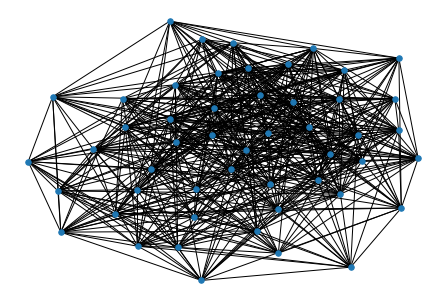

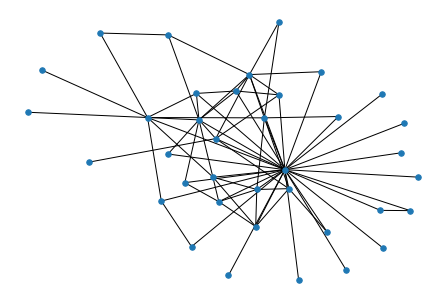

[1300/2000]: vae_loss:9.4079, prior_loss:3.5121
ADJ w/o sigmoid tensor([[ 7.5944,  2.6930, -0.8754,  ...,  2.7681,  2.9117,  0.7324],
        [ 2.6930,  5.1605, -1.5056,  ...,  1.0053,  0.3792, -2.3059],
        [-0.8754, -1.5056,  9.2972,  ..., -1.6479, -1.7980,  2.5113],
        ...,
        [ 2.7681,  1.0053, -1.6479,  ..., 10.6306,  1.8007, -0.4275],
        [ 2.9117,  0.3792, -1.7980,  ...,  1.8007,  7.4492, -1.7010],
        [ 0.7324, -2.3059,  2.5113,  ..., -0.4275, -1.7010,  5.4937]],
       grad_fn=<CopyBackwards>)
ADJ w/ sigmoid tensor([[0.9995, 0.9366, 0.2941,  ..., 0.9409, 0.9484, 0.6753],
        [0.9366, 0.9943, 0.1816,  ..., 0.7321, 0.5937, 0.0906],
        [0.2941, 0.1816, 0.9999,  ..., 0.1614, 0.1421, 0.9249],
        ...,
        [0.9409, 0.7321, 0.1614,  ..., 1.0000, 0.8582, 0.3947],
        [0.9484, 0.5937, 0.1421,  ..., 0.8582, 0.9994, 0.1543],
        [0.6753, 0.0906, 0.9249,  ..., 0.3947, 0.1543, 0.9959]],
       grad_fn=<CopyBackwards>)


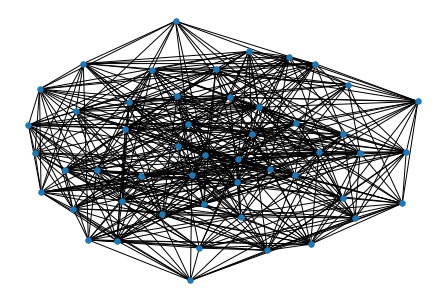

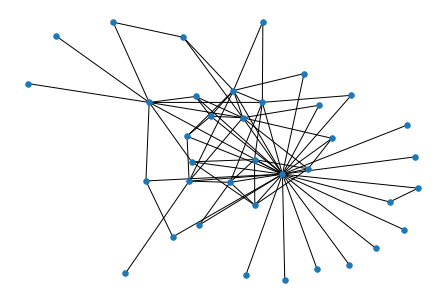

[1350/2000]: vae_loss:11.2320, prior_loss:3.6597
ADJ w/o sigmoid tensor([[ 7.7484, -1.8486,  0.5613,  ...,  1.2952,  0.6174, -0.0642],
        [-1.8486, 10.8868, -2.3099,  ...,  0.7702, -0.6382,  4.0256],
        [ 0.5613, -2.3099, 15.5285,  ...,  2.3820,  4.9167, -0.0832],
        ...,
        [ 1.2952,  0.7702,  2.3820,  ...,  3.6434,  3.9244, -1.7748],
        [ 0.6174, -0.6382,  4.9167,  ...,  3.9244, 10.1031,  0.5446],
        [-0.0642,  4.0256, -0.0832,  ..., -1.7748,  0.5446, 11.5582]],
       grad_fn=<CopyBackwards>)
ADJ w/ sigmoid tensor([[0.9996, 0.1360, 0.6368,  ..., 0.7850, 0.6496, 0.4839],
        [0.1360, 1.0000, 0.0903,  ..., 0.6836, 0.3456, 0.9825],
        [0.6368, 0.0903, 1.0000,  ..., 0.9154, 0.9927, 0.4792],
        ...,
        [0.7850, 0.6836, 0.9154,  ..., 0.9745, 0.9806, 0.1450],
        [0.6496, 0.3456, 0.9927,  ..., 0.9806, 1.0000, 0.6329],
        [0.4839, 0.9825, 0.4792,  ..., 0.1450, 0.6329, 1.0000]],
       grad_fn=<CopyBackwards>)


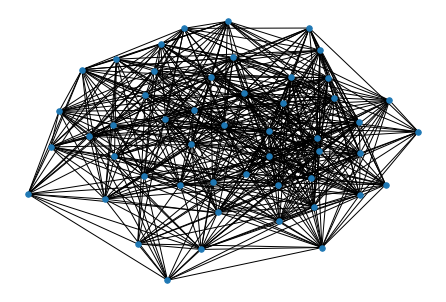

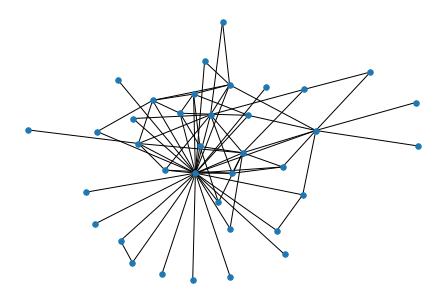

[1400/2000]: vae_loss:10.1524, prior_loss:3.7775
ADJ w/o sigmoid tensor([[ 7.5117, -2.3754,  0.7264,  ..., -0.8457, -0.5054,  2.1274],
        [-2.3754, 11.9749,  1.1349,  ..., -0.7312,  1.1876, -2.3578],
        [ 0.7264,  1.1349,  5.6779,  ..., -2.6413,  1.4212, -0.3051],
        ...,
        [-0.8457, -0.7312, -2.6413,  ..., 12.9219,  1.6858,  0.8632],
        [-0.5054,  1.1876,  1.4212,  ...,  1.6858,  6.5177, -0.6216],
        [ 2.1274, -2.3578, -0.3051,  ...,  0.8632, -0.6216,  3.8338]],
       grad_fn=<CopyBackwards>)
ADJ w/ sigmoid tensor([[0.9995, 0.0851, 0.6740,  ..., 0.3003, 0.3763, 0.8935],
        [0.0851, 1.0000, 0.7567,  ..., 0.3249, 0.7663, 0.0864],
        [0.6740, 0.7567, 0.9966,  ..., 0.0665, 0.8055, 0.4243],
        ...,
        [0.3003, 0.3249, 0.0665,  ..., 1.0000, 0.8437, 0.7033],
        [0.3763, 0.7663, 0.8055,  ..., 0.8437, 0.9985, 0.3494],
        [0.8935, 0.0864, 0.4243,  ..., 0.7033, 0.3494, 0.9788]],
       grad_fn=<CopyBackwards>)


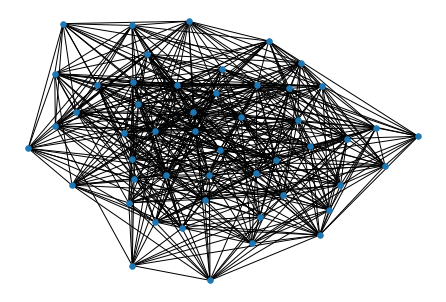

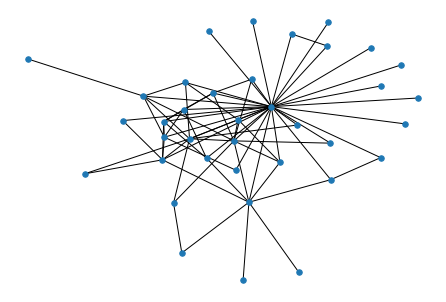

[1450/2000]: vae_loss:10.5756, prior_loss:3.8771
ADJ w/o sigmoid tensor([[12.7696,  0.6234,  0.7592,  ..., -1.4060, -3.9275, -2.8401],
        [ 0.6234,  9.0178,  0.2200,  ...,  0.1446,  0.3076, -0.7395],
        [ 0.7592,  0.2200,  6.4513,  ..., -1.6527,  0.3125, -1.6373],
        ...,
        [-1.4060,  0.1446, -1.6527,  ...,  9.0895,  2.3593, -1.0226],
        [-3.9275,  0.3076,  0.3125,  ...,  2.3593,  7.9249,  0.5308],
        [-2.8401, -0.7395, -1.6373,  ..., -1.0226,  0.5308,  7.1494]],
       grad_fn=<CopyBackwards>)
ADJ w/ sigmoid tensor([[1.0000, 0.6510, 0.6812,  ..., 0.1969, 0.0193, 0.0552],
        [0.6510, 0.9999, 0.5548,  ..., 0.5361, 0.5763, 0.3231],
        [0.6812, 0.5548, 0.9984,  ..., 0.1607, 0.5775, 0.1628],
        ...,
        [0.1969, 0.5361, 0.1607,  ..., 0.9999, 0.9137, 0.2645],
        [0.0193, 0.5763, 0.5775,  ..., 0.9137, 0.9996, 0.6297],
        [0.0552, 0.3231, 0.1628,  ..., 0.2645, 0.6297, 0.9992]],
       grad_fn=<CopyBackwards>)


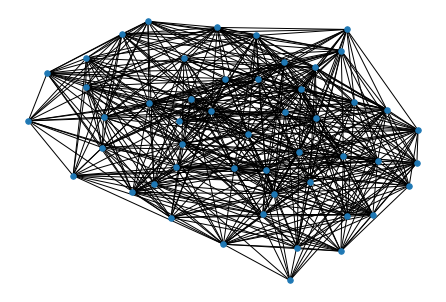

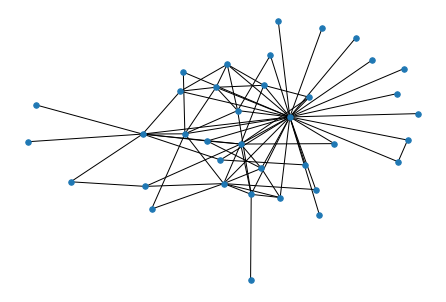

[1500/2000]: vae_loss:8.8256, prior_loss:3.9647
ADJ w/o sigmoid tensor([[ 5.1957, -2.5138, -1.6275,  ...,  0.2174, -0.4480,  1.2411],
        [-2.5138,  7.9816,  3.3991,  ...,  0.8618,  0.8622,  1.1326],
        [-1.6275,  3.3991,  7.4225,  ...,  2.1909, -0.0312,  1.7202],
        ...,
        [ 0.2174,  0.8618,  2.1909,  ...,  6.6935, -1.5258,  0.2622],
        [-0.4480,  0.8622, -0.0312,  ..., -1.5258,  8.2597,  0.7733],
        [ 1.2411,  1.1326,  1.7202,  ...,  0.2622,  0.7733,  5.1746]],
       grad_fn=<CopyBackwards>)
ADJ w/ sigmoid tensor([[0.9945, 0.0749, 0.1642,  ..., 0.5541, 0.3898, 0.7758],
        [0.0749, 0.9997, 0.9677,  ..., 0.7030, 0.7031, 0.7563],
        [0.1642, 0.9677, 0.9994,  ..., 0.8994, 0.4922, 0.8482],
        ...,
        [0.5541, 0.7030, 0.8994,  ..., 0.9988, 0.1786, 0.5652],
        [0.3898, 0.7031, 0.4922,  ..., 0.1786, 0.9997, 0.6842],
        [0.7758, 0.7563, 0.8482,  ..., 0.5652, 0.6842, 0.9944]],
       grad_fn=<CopyBackwards>)


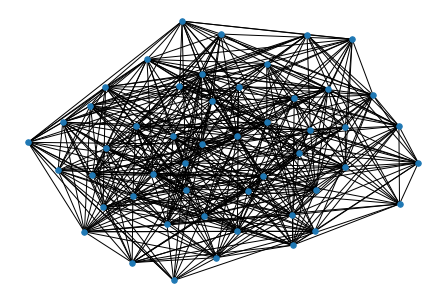

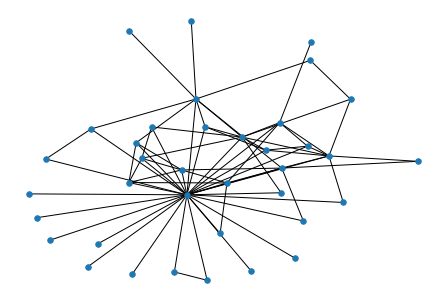

[1550/2000]: vae_loss:10.5157, prior_loss:4.0321
ADJ w/o sigmoid tensor([[11.3065,  0.6517, -0.0132,  ..., -0.4290, -2.7545,  2.2850],
        [ 0.6517,  7.9638, -1.1090,  ..., -0.1890, -0.4910,  2.9344],
        [-0.0132, -1.1090, 12.4322,  ...,  5.1219,  0.2170, -3.1017],
        ...,
        [-0.4290, -0.1890,  5.1219,  ...,  9.5783, -0.5237, -0.1974],
        [-2.7545, -0.4910,  0.2170,  ..., -0.5237,  6.0949, -2.1560],
        [ 2.2850,  2.9344, -3.1017,  ..., -0.1974, -2.1560,  9.1549]],
       grad_fn=<CopyBackwards>)
ADJ w/ sigmoid tensor([[1.0000, 0.6574, 0.4967,  ..., 0.3944, 0.0598, 0.9076],
        [0.6574, 0.9997, 0.2481,  ..., 0.4529, 0.3797, 0.9495],
        [0.4967, 0.2481, 1.0000,  ..., 0.9941, 0.5540, 0.0430],
        ...,
        [0.3944, 0.4529, 0.9941,  ..., 0.9999, 0.3720, 0.4508],
        [0.0598, 0.3797, 0.5540,  ..., 0.3720, 0.9978, 0.1038],
        [0.9076, 0.9495, 0.0430,  ..., 0.4508, 0.1038, 0.9999]],
       grad_fn=<CopyBackwards>)


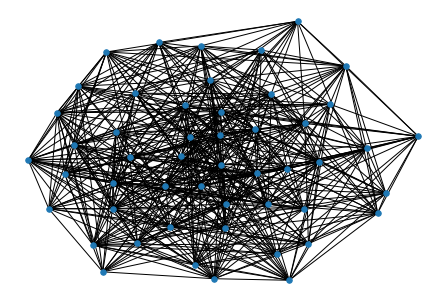

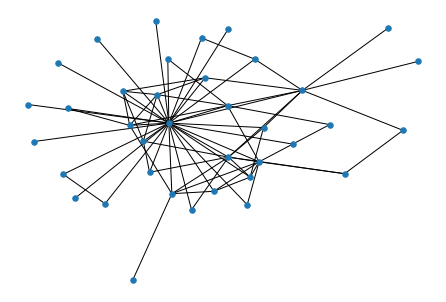

[1600/2000]: vae_loss:10.3220, prior_loss:4.0681
ADJ w/o sigmoid tensor([[ 8.8617, -0.5057, -0.6920,  ..., -0.6861,  1.9798,  1.4984],
        [-0.5057,  6.1110,  1.0479,  ..., -1.4819,  3.7235,  0.5944],
        [-0.6920,  1.0479,  9.7738,  ...,  3.3291,  1.1749, -0.0725],
        ...,
        [-0.6861, -1.4819,  3.3291,  ...,  8.5691, -3.6775, -0.9824],
        [ 1.9798,  3.7235,  1.1749,  ..., -3.6775, 11.3396,  2.5136],
        [ 1.4984,  0.5944, -0.0725,  ..., -0.9824,  2.5136, 13.0366]],
       grad_fn=<CopyBackwards>)
ADJ w/ sigmoid tensor([[0.9999, 0.3762, 0.3336,  ..., 0.3349, 0.8787, 0.8173],
        [0.3762, 0.9978, 0.7404,  ..., 0.1851, 0.9764, 0.6444],
        [0.3336, 0.7404, 0.9999,  ..., 0.9654, 0.7640, 0.4819],
        ...,
        [0.3349, 0.1851, 0.9654,  ..., 0.9998, 0.0247, 0.2724],
        [0.8787, 0.9764, 0.7640,  ..., 0.0247, 1.0000, 0.9251],
        [0.8173, 0.6444, 0.4819,  ..., 0.2724, 0.9251, 1.0000]],
       grad_fn=<CopyBackwards>)


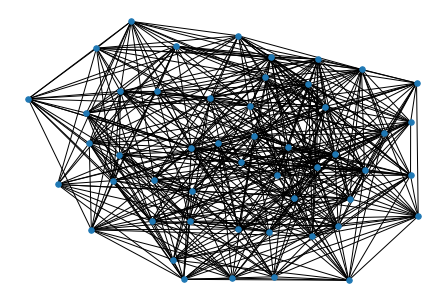

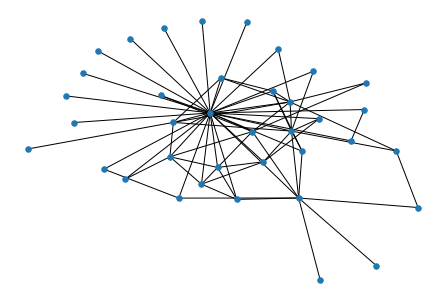

[1650/2000]: vae_loss:10.8245, prior_loss:4.1033
ADJ w/o sigmoid tensor([[ 7.1366e+00,  1.7994e+00, -9.2268e-02,  ..., -2.0421e+00,
          1.2719e-02, -1.7354e-01],
        [ 1.7994e+00,  1.1541e+01, -1.3240e+00,  ...,  6.4163e-01,
          1.8050e-01, -8.6341e-01],
        [-9.2268e-02, -1.3240e+00,  8.0753e+00,  ..., -1.0377e+00,
          3.9412e+00, -2.3131e+00],
        ...,
        [-2.0421e+00,  6.4163e-01, -1.0377e+00,  ...,  6.2658e+00,
         -2.2066e+00,  2.0852e+00],
        [ 1.2719e-02,  1.8050e-01,  3.9412e+00,  ..., -2.2066e+00,
          1.3395e+01,  2.6164e+00],
        [-1.7354e-01, -8.6341e-01, -2.3131e+00,  ...,  2.0852e+00,
          2.6164e+00,  1.1800e+01]], grad_fn=<CopyBackwards>)
ADJ w/ sigmoid tensor([[0.9992, 0.8581, 0.4769,  ..., 0.1149, 0.5032, 0.4567],
        [0.8581, 1.0000, 0.2101,  ..., 0.6551, 0.5450, 0.2966],
        [0.4769, 0.2101, 0.9997,  ..., 0.2616, 0.9809, 0.0900],
        ...,
        [0.1149, 0.6551, 0.2616,  ..., 0.9981, 0.0992, 0.8

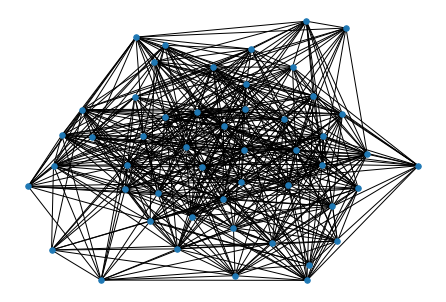

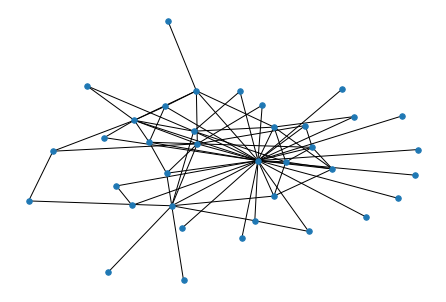

[1700/2000]: vae_loss:10.7258, prior_loss:4.1543
ADJ w/o sigmoid tensor([[ 8.8362,  0.0558,  3.1951,  ...,  0.5858, -4.0746,  0.2995],
        [ 0.0558,  8.5196, -4.3835,  ..., -0.4388,  2.5376, -0.9437],
        [ 3.1951, -4.3835, 10.7942,  ...,  3.8703, -0.8875,  0.1455],
        ...,
        [ 0.5858, -0.4388,  3.8703,  ...,  9.2774,  1.1338, -1.5283],
        [-4.0746,  2.5376, -0.8875,  ...,  1.1338, 10.4187, -0.8153],
        [ 0.2995, -0.9437,  0.1455,  ..., -1.5283, -0.8153,  2.7524]],
       grad_fn=<CopyBackwards>)
ADJ w/ sigmoid tensor([[0.9999, 0.5139, 0.9606,  ..., 0.6424, 0.0167, 0.5743],
        [0.5139, 0.9998, 0.0123,  ..., 0.3920, 0.9267, 0.2801],
        [0.9606, 0.0123, 1.0000,  ..., 0.9796, 0.2916, 0.5363],
        ...,
        [0.6424, 0.3920, 0.9796,  ..., 0.9999, 0.7565, 0.1782],
        [0.0167, 0.9267, 0.2916,  ..., 0.7565, 1.0000, 0.3068],
        [0.5743, 0.2801, 0.5363,  ..., 0.1782, 0.3068, 0.9401]],
       grad_fn=<CopyBackwards>)


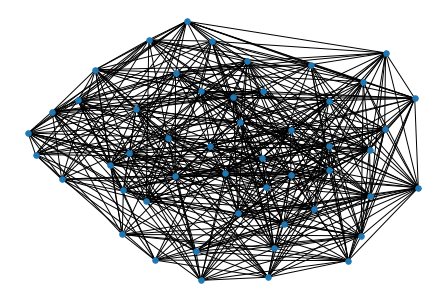

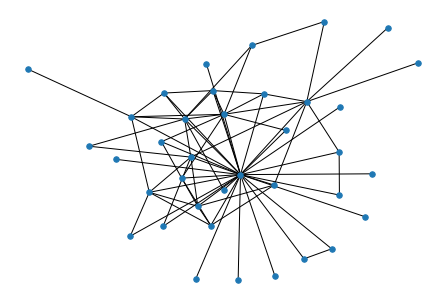

[1750/2000]: vae_loss:10.6759, prior_loss:4.1492
ADJ w/o sigmoid tensor([[ 7.2273, -2.4535, -1.3499,  ..., -2.0461, -0.1348, -2.4461],
        [-2.4535,  6.5545,  1.6358,  ...,  3.8658, -0.5974, -0.7056],
        [-1.3499,  1.6358,  6.1236,  ...,  5.0218, -0.6093,  2.5315],
        ...,
        [-2.0461,  3.8658,  5.0218,  ...,  8.6379, -2.2245,  2.9059],
        [-0.1348, -0.5974, -0.6093,  ..., -2.2245,  9.8456,  0.4810],
        [-2.4461, -0.7056,  2.5315,  ...,  2.9059,  0.4810,  8.2825]],
       grad_fn=<CopyBackwards>)
ADJ w/ sigmoid tensor([[0.9993, 0.0792, 0.2059,  ..., 0.1144, 0.4664, 0.0797],
        [0.0792, 0.9986, 0.8370,  ..., 0.9795, 0.3549, 0.3306],
        [0.2059, 0.8370, 0.9978,  ..., 0.9935, 0.3522, 0.9263],
        ...,
        [0.1144, 0.9795, 0.9935,  ..., 0.9998, 0.0976, 0.9481],
        [0.4664, 0.3549, 0.3522,  ..., 0.0976, 0.9999, 0.6180],
        [0.0797, 0.3306, 0.9263,  ..., 0.9481, 0.6180, 0.9997]],
       grad_fn=<CopyBackwards>)


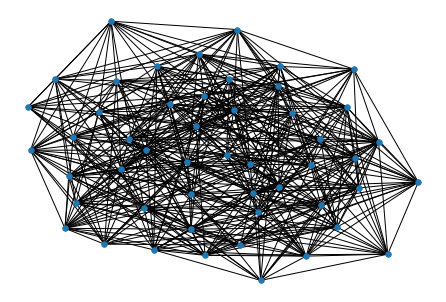

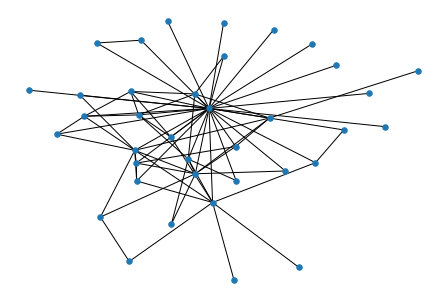

[1800/2000]: vae_loss:10.8856, prior_loss:4.1579
ADJ w/o sigmoid tensor([[14.8703,  3.9364, -1.8330,  ...,  0.2224, -0.2451,  0.8291],
        [ 3.9364, 10.4553, -1.1319,  ...,  1.0377,  2.8393, -4.7609],
        [-1.8330, -1.1319,  8.6618,  ...,  1.1628,  0.5161, -1.3070],
        ...,
        [ 0.2224,  1.0377,  1.1628,  ...,  4.6597, -3.4830,  0.7128],
        [-0.2451,  2.8393,  0.5161,  ..., -3.4830,  8.0497, -5.8456],
        [ 0.8291, -4.7609, -1.3070,  ...,  0.7128, -5.8456, 15.7357]],
       grad_fn=<CopyBackwards>)
ADJ w/ sigmoid tensor([[1.0000, 0.9809, 0.1379,  ..., 0.5554, 0.4390, 0.6962],
        [0.9809, 1.0000, 0.2438,  ..., 0.7384, 0.9448, 0.0085],
        [0.1379, 0.2438, 0.9998,  ..., 0.7618, 0.6262, 0.2130],
        ...,
        [0.5554, 0.7384, 0.7618,  ..., 0.9906, 0.0298, 0.6710],
        [0.4390, 0.9448, 0.6262,  ..., 0.0298, 0.9997, 0.0029],
        [0.6962, 0.0085, 0.2130,  ..., 0.6710, 0.0029, 1.0000]],
       grad_fn=<CopyBackwards>)


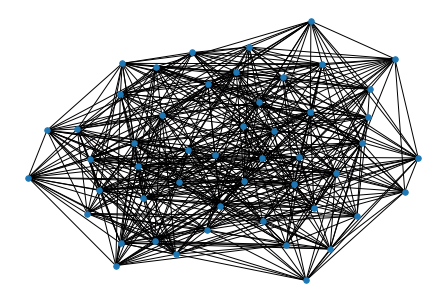

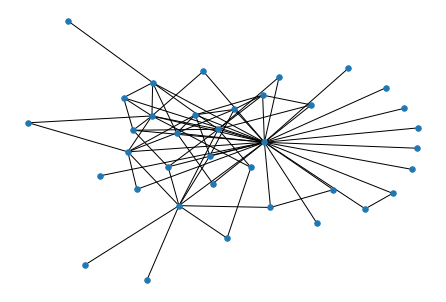

[1850/2000]: vae_loss:11.4289, prior_loss:4.1761
ADJ w/o sigmoid tensor([[ 9.6048, -2.1266,  0.7440,  ...,  0.6428, -0.7903, -1.3628],
        [-2.1266,  8.0006, -1.2618,  ..., -1.1185,  3.5408, -3.7756],
        [ 0.7440, -1.2618,  6.8528,  ..., -1.8968, -0.6703, -2.8142],
        ...,
        [ 0.6428, -1.1185, -1.8968,  ..., 12.6554, -1.2556,  3.6622],
        [-0.7903,  3.5408, -0.6703,  ..., -1.2556,  4.6465, -0.4783],
        [-1.3628, -3.7756, -2.8142,  ...,  3.6622, -0.4783, 14.1710]],
       grad_fn=<CopyBackwards>)
ADJ w/ sigmoid tensor([[0.9999, 0.1065, 0.6779,  ..., 0.6554, 0.3121, 0.2038],
        [0.1065, 0.9997, 0.2207,  ..., 0.2463, 0.9718, 0.0224],
        [0.6779, 0.2207, 0.9989,  ..., 0.1305, 0.3384, 0.0566],
        ...,
        [0.6554, 0.2463, 0.1305,  ..., 1.0000, 0.2217, 0.9750],
        [0.3121, 0.9718, 0.3384,  ..., 0.2217, 0.9905, 0.3827],
        [0.2038, 0.0224, 0.0566,  ..., 0.9750, 0.3827, 1.0000]],
       grad_fn=<CopyBackwards>)


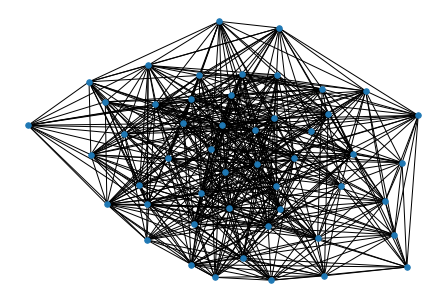

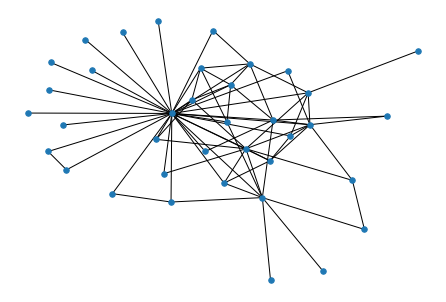

[1900/2000]: vae_loss:10.9084, prior_loss:4.1803
ADJ w/o sigmoid tensor([[ 7.8699,  1.6056,  0.4474,  ...,  3.3760, -3.2901,  2.0202],
        [ 1.6056,  6.2764,  1.5682,  ..., -0.7742, -1.0572, -0.4721],
        [ 0.4474,  1.5682, 10.6286,  ...,  0.3808, -0.4500,  5.1459],
        ...,
        [ 3.3760, -0.7742,  0.3808,  ...,  7.3704, -3.7622, -1.2199],
        [-3.2901, -1.0572, -0.4500,  ..., -3.7622, 14.2609,  0.6954],
        [ 2.0202, -0.4721,  5.1459,  ..., -1.2199,  0.6954,  9.5361]],
       grad_fn=<CopyBackwards>)
ADJ w/ sigmoid tensor([[0.9996, 0.8328, 0.6100,  ..., 0.9669, 0.0359, 0.8829],
        [0.8328, 0.9981, 0.8275,  ..., 0.3156, 0.2578, 0.3841],
        [0.6100, 0.8275, 1.0000,  ..., 0.5941, 0.3894, 0.9942],
        ...,
        [0.9669, 0.3156, 0.5941,  ..., 0.9994, 0.0227, 0.2280],
        [0.0359, 0.2578, 0.3894,  ..., 0.0227, 1.0000, 0.6672],
        [0.8829, 0.3841, 0.9942,  ..., 0.2280, 0.6672, 0.9999]],
       grad_fn=<CopyBackwards>)


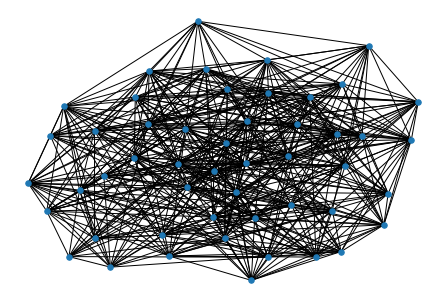

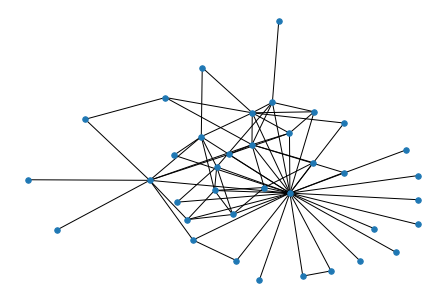

[1950/2000]: vae_loss:10.1127, prior_loss:4.1783
ADJ w/o sigmoid tensor([[11.4921,  0.7280,  0.6746,  ..., -0.4412, -1.5352, -1.6264],
        [ 0.7280,  6.9808, -1.0543,  ...,  3.7081, -0.3561, -1.9980],
        [ 0.6746, -1.0543,  6.5750,  ..., -2.5562, -0.8855,  2.4159],
        ...,
        [-0.4412,  3.7081, -2.5562,  ...,  8.2079, -3.0642, -2.9487],
        [-1.5352, -0.3561, -0.8855,  ..., -3.0642, 10.1429,  3.7855],
        [-1.6264, -1.9980,  2.4159,  ..., -2.9487,  3.7855,  7.7310]],
       grad_fn=<CopyBackwards>)
ADJ w/ sigmoid tensor([[1.0000, 0.6744, 0.6625,  ..., 0.3915, 0.1772, 0.1643],
        [0.6744, 0.9991, 0.2584,  ..., 0.9761, 0.4119, 0.1194],
        [0.6625, 0.2584, 0.9986,  ..., 0.0720, 0.2920, 0.9180],
        ...,
        [0.3915, 0.9761, 0.0720,  ..., 0.9997, 0.0446, 0.0498],
        [0.1772, 0.4119, 0.2920,  ..., 0.0446, 1.0000, 0.9778],
        [0.1643, 0.1194, 0.9180,  ..., 0.0498, 0.9778, 0.9996]],
       grad_fn=<CopyBackwards>)


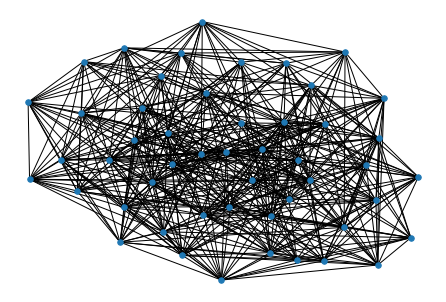

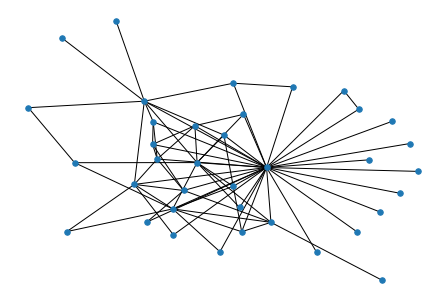

In [30]:
## Implement VAE/GAE Here to check the results

av_size = 0  # set 0 if you do not need attr_vec
# d_size = 8
#z_size = 64
#gc_size = 16
d_size = 32
z_size = 16
gc_size = 32
rep_size = 32
z_out_size = z_size + av_size

adj_thresh = .6
max_epochs = 2000
lr = 1e-4


beta = 5
alpha = 0.1
gamma = 15

G = Generator(
    av_size=av_size,
    d_size=d_size,
    gc_size=gc_size,
    z_size=z_size,
    z_out_size=z_out_size,
    rep_size=rep_size
).cuda()

D = Discriminator(
    av_size=av_size,
    d_size=d_size,
    gc_size=gc_size
).cuda()

criterion_bce = nn.BCELoss()
criterion_bce.cuda()

loss_MSE = nn.MSELoss()
loss_MSE.cuda()   
loss_BCE = nn.BCELoss()
loss_BCE.cuda()      
loss_BCE_logits = nn.BCEWithLogitsLoss()
loss_BCE_logits.cuda()      
  
# loss for A and A'
# todo: add the loss to main
criterion_bcell = nn.BCEWithLogitsLoss()
criterion_bcell.cuda()

print('opt_vae',G.parameters())

# I won't use the next 3 lines
opt_enc = optim.RMSprop(G.encoder.parameters(), lr=lr)
opt_dec = optim.RMSprop(G.decoder.parameters(), lr=lr)
opt_dis = optim.RMSprop(D.parameters(), lr=lr * alpha)

opt_vae = optim.RMSprop(G.parameters(), lr=lr)
#opt_vae = optim.Adam(G.parameters(), lr=lr)


for epoch in range(max_epochs):
    D_real_list, D_rec_enc_list, D_rec_noise_list, D_list = [], [], [], []
    # g_loss_list, rec_loss_list, prior_loss_list = [], [], []
    g_loss_list, rec_loss_list, prior_loss_list, aa_loss_list = [], [], [], []
    # for i in range(len(t_adj_mats)):
    # Only train the 8th graph
    for i in range(8, 9): 
        ones_label = Variable(torch.ones(1)).cuda()
        zeros_label = Variable(torch.zeros(1)).cuda()
        
        adj = Variable(t_adj_mats[i]).cuda()
        if adj.shape[0] <= d_size:
            continue
            
        if av_size == 0:
            attr_vec = None
        else:
            attr_vec = Variable(t_attr_vecs[i, :]).cuda()
        
        G.set_attr_vec(attr_vec)
        D.set_attr_vec(attr_vec)
        
        mean, logvar, rec_adj = G(adj)
        
        noisev = torch.randn(mean.shape, requires_grad=True).cuda()
        noisev = cat_attr(noisev, attr_vec)
        rec_noise = G.decoder(noisev)
        
        # train discriminator
        output = D(adj)
        errD_real = criterion_bce(output, ones_label)
        D_real_list.append(output.data.mean())
        output = D(rec_adj)
        errD_rec_enc = criterion_bce(output, zeros_label)
        D_rec_enc_list.append(output.data.mean())
        output = D(rec_noise)
        errD_rec_noise = criterion_bce(output, zeros_label)
        D_rec_noise_list.append(output.data.mean())
        
        dis_img_loss = errD_real + errD_rec_enc + errD_rec_noise
        # print ("print (dis_img_loss)", dis_img_loss)
        D_list.append(dis_img_loss.data.mean())
        opt_dis.zero_grad()
        dis_img_loss.backward(retain_graph=True)
        opt_dis.step()
        
        
        # AA_loss b/w rec_adj and adj
        aa_loss = loss_MSE(rec_adj, adj)
        #aa_loss = loss_BCE_logits(rec_adj, adj)
        
        # fix me: sum version of prior loss
        pl = []
        for i in range(mean.size()[0]):
            prior_loss = 1 + logvar[i, :] - mean[i, :].pow(2) - logvar[i, :].exp()
            prior_loss = (-0.5 * torch.sum(prior_loss))/torch.numel(mean[i, :].data)
            pl.append(prior_loss)
        prior_loss_list.append(sum(pl))
        kl_loss = sum(pl)
        vae_loss = kl_loss + aa_loss
    
        opt_vae.zero_grad()
        vae_loss.backward() #retain_graph=True
        opt_vae.step()
        
    if epoch % 50 == 0:   
        print('[%d/%d]: vae_loss:%.4f, prior_loss:%.4f' 
               % (epoch, 
                  max_epochs, 
                  torch.mean(torch.stack([vae_loss])),
                  torch.mean(torch.stack(prior_loss_list))))
        print('ADJ w/o sigmoid', rec_adj.cpu())
        print('ADJ w/ sigmoid', F.sigmoid(rec_adj).cpu())

        # print('max',(rec_adj.max()),'min',(rec_adj.min()))
        # b_adj = sample_adj(F.sigmoid(rec_adj))
        
        show_graph(F.sigmoid(rec_adj), thresh=adj_thresh)
        show_graph(adj, thresh=0.1)


[0/1000]: D_real:0.1728, D_enc:0.1758, D_noise:0.1755, Loss_D:2.1421, Loss_G:2399.6653, rec_loss:0.0002, prior_loss:0.4061
tensor([[1.1691, 1.0173, 0.0000,  ..., 0.1410, 0.6096, 0.5322],
        [1.0173, 2.0360, 0.0000,  ..., 0.2048, 0.8857, 0.7733],
        [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.1410, 0.2048, 0.0000,  ..., 0.0361, 0.1559, 0.1361],
        [0.6096, 0.8857, 0.0000,  ..., 0.1559, 0.6741, 0.5885],
        [0.5322, 0.7733, 0.0000,  ..., 0.1361, 0.5885, 0.5138]],
       grad_fn=<CopyBackwards>)


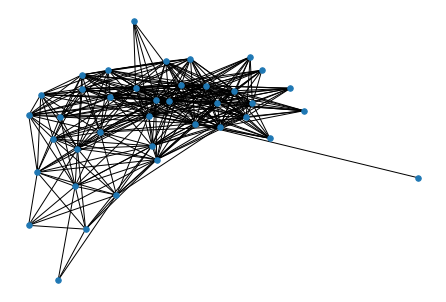

{'LCC': 39,
 'claw_count': 51647.0,
 'cpl': 1.6126855600539811,
 'd': 18.0,
 'd_max': 34.0,
 'd_min': 1.0,
 'edge_num': 367,
 'gini': 0.19088319088319095,
 'n_components': 1,
 'node_num': 39,
 'power_law_exp': 1.3643618953816576,
 'rel_edge_distr_entropy': 0.9716468131524878,
 'square_count': 4155,
 'triangle_count': 1487,
 'wedge_count': 7134.0}
[50/1000]: D_real:0.2775, D_enc:0.2766, D_noise:0.2775, Loss_D:1.9307, Loss_G:2073.4385, rec_loss:0.0003, prior_loss:0.0546
tensor([[2.6897, 0.6381, 0.2554,  ..., 1.3160, 1.9508, 1.2194],
        [0.6381, 0.1697, 0.0116,  ..., 0.3324, 0.4780, 0.2524],
        [0.2554, 0.0116, 0.2046,  ..., 0.0227, 0.0987, 0.2052],
        ...,
        [1.3160, 0.3324, 0.0227,  ..., 0.7133, 1.0160, 0.5648],
        [1.9508, 0.4780, 0.0987,  ..., 1.0160, 1.4701, 0.8621],
        [1.2194, 0.2524, 0.2052,  ..., 0.5648, 0.8621, 0.6389]],
       grad_fn=<CopyBackwards>)


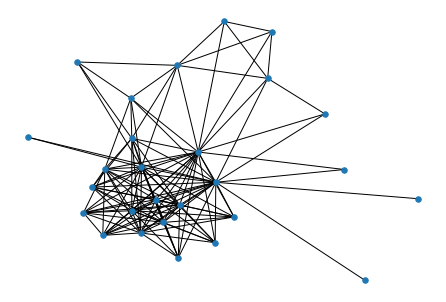

{'LCC': 27,
 'claw_count': 8845.0,
 'cpl': 1.6666666666666667,
 'd': 10.185185185185185,
 'd_max': 23.0,
 'd_min': 1.0,
 'edge_num': 146,
 'gini': 0.2787878787878788,
 'n_components': 1,
 'node_num': 27,
 'power_law_exp': 1.4916377351286014,
 'rel_edge_distr_entropy': 0.9363640261923373,
 'square_count': 690,
 'triangle_count': 359,
 'wedge_count': 1805.0}
[100/1000]: D_real:0.3141, D_enc:0.3129, D_noise:0.3127, Loss_D:1.9082, Loss_G:1936.3942, rec_loss:0.0002, prior_loss:0.0293
tensor([[0.5141, 0.1252, 0.0275,  ..., 0.1306, 0.1973, 0.4500],
        [0.1252, 0.8018, 0.0790,  ..., 0.2723, 0.9266, 0.0000],
        [0.0275, 0.0790, 0.0115,  ..., 0.0253, 0.0878, 0.0481],
        ...,
        [0.1306, 0.2723, 0.0253,  ..., 0.1162, 0.3324, 0.0435],
        [0.1973, 0.9266, 0.0878,  ..., 0.3324, 1.0857, 0.0000],
        [0.4500, 0.0000, 0.0481,  ..., 0.0435, 0.0000, 0.7849]],
       grad_fn=<CopyBackwards>)


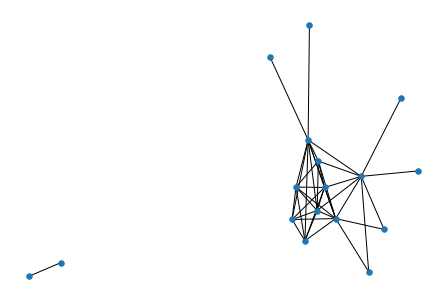

{'LCC': 15,
 'claw_count': 780.0,
 'cpl': 1.7547169811320755,
 'd': 5.470588235294118,
 'd_max': 11.0,
 'd_min': 1.0,
 'edge_num': 53,
 'gini': 0.260594560404807,
 'n_components': 2,
 'node_num': 17,
 'power_law_exp': 1.730202979723796,
 'rel_edge_distr_entropy': 0.910322436767213,
 'square_count': 55,
 'triangle_count': 57,
 'wedge_count': 325.0}
[150/1000]: D_real:0.3288, D_enc:0.3282, D_noise:0.3250, Loss_D:1.9034, Loss_G:1831.9183, rec_loss:0.0003, prior_loss:0.0213
tensor([[0.1619, 0.1838, 0.0137,  ..., 0.0013, 0.0000, 0.1803],
        [0.1838, 0.2100, 0.0000,  ..., 0.0000, 0.0000, 0.2060],
        [0.0137, 0.0000, 0.1865,  ..., 0.0171, 0.0000, 0.0000],
        ...,
        [0.0013, 0.0000, 0.0171,  ..., 0.5109, 0.0000, 0.0000],
        [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.1803, 0.2060, 0.0000,  ..., 0.0000, 0.0000, 0.2021]],
       grad_fn=<CopyBackwards>)


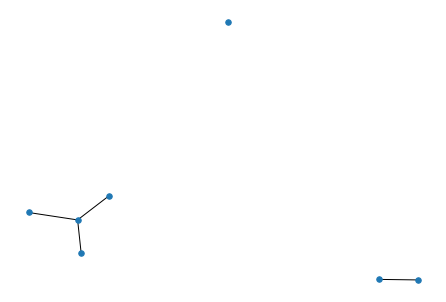

{'LCC': 4,
 'claw_count': 4.0,
 'cpl': 1.4285714285714286,
 'd': 2.0,
 'd_max': 4.0,
 'd_min': 1.0,
 'edge_num': 10,
 'gini': -0.06122448979591821,
 'n_components': 3,
 'node_num': 7,
 'power_law_exp': 2.6831442143704574,
 'rel_edge_distr_entropy': 0.9490875648474365,
 'square_count': 0,
 'triangle_count': 0,
 'wedge_count': 10.0}
[200/1000]: D_real:0.3352, D_enc:0.3310, D_noise:0.3322, Loss_D:1.8987, Loss_G:1889.5027, rec_loss:0.0003, prior_loss:0.0161
tensor([[0.2895, 0.0000, 0.0000,  ..., 0.1901, 0.2790, 0.2741],
        [0.0000, 0.1252, 0.0672,  ..., 0.0000, 0.0000, 0.0701],
        [0.0000, 0.0672, 0.1717,  ..., 0.0011, 0.0467, 0.0620],
        ...,
        [0.1901, 0.0000, 0.0011,  ..., 0.1250, 0.1892, 0.1800],
        [0.2790, 0.0000, 0.0467,  ..., 0.1892, 0.5227, 0.2641],
        [0.2741, 0.0701, 0.0620,  ..., 0.1800, 0.2641, 0.3035]],
       grad_fn=<CopyBackwards>)


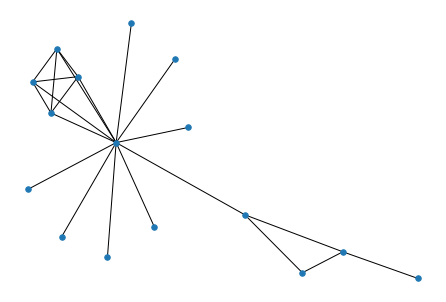

{'LCC': 16,
 'claw_count': 328.0,
 'cpl': 2.191666666666667,
 'd': 3.1875,
 'd_max': 13.0,
 'd_min': 1.0,
 'edge_num': 29,
 'gini': 0.3125,
 'n_components': 1,
 'node_num': 16,
 'power_law_exp': 2.236625074828039,
 'rel_edge_distr_entropy': 0.8742977766535949,
 'square_count': 5,
 'triangle_count': 11,
 'wedge_count': 128.0}
[250/1000]: D_real:0.3382, D_enc:0.3299, D_noise:0.3294, Loss_D:1.8840, Loss_G:1829.7987, rec_loss:0.0003, prior_loss:0.0113
tensor([[0.0108, 0.0209, 0.0000,  ..., 0.0052, 0.0168, 0.0265],
        [0.0209, 0.0858, 0.1196,  ..., 0.0844, 0.0294, 0.0464],
        [0.0000, 0.1196, 0.4112,  ..., 0.2317, 0.0622, 0.0000],
        ...,
        [0.0052, 0.0844, 0.2317,  ..., 0.1486, 0.0085, 0.0134],
        [0.0168, 0.0294, 0.0622,  ..., 0.0085, 0.1172, 0.0435],
        [0.0265, 0.0464, 0.0000,  ..., 0.0134, 0.0435, 0.0686]],
       grad_fn=<CopyBackwards>)


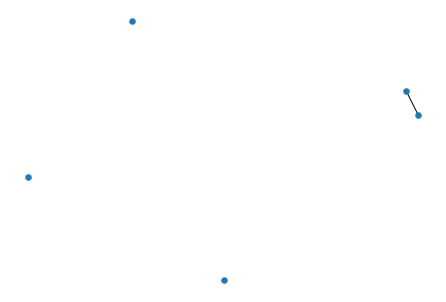

{'LCC': 2,
 'claw_count': 0.0,
 'cpl': 1.0,
 'd': 1.4,
 'd_max': 2.0,
 'd_min': 1.0,
 'edge_num': 6,
 'gini': -0.22857142857142854,
 'n_components': 4,
 'node_num': 5,
 'power_law_exp': 4.606737602222409,
 'rel_edge_distr_entropy': 0.9629166855028993,
 'square_count': 0,
 'triangle_count': 0,
 'wedge_count': 2.0}
[300/1000]: D_real:0.3403, D_enc:0.3330, D_noise:0.3306, Loss_D:1.8841, Loss_G:1808.0513, rec_loss:0.0003, prior_loss:0.0086
tensor([[0.0211, 0.0478, 0.0000,  ..., 0.0526, 0.0000, 0.0000],
        [0.0478, 0.3647, 0.0000,  ..., 0.1990, 0.0000, 0.1635],
        [0.0000, 0.0000, 0.5037,  ..., 0.1846, 0.0466, 0.0000],
        ...,
        [0.0526, 0.1990, 0.1846,  ..., 0.2357, 0.0201, 0.0509],
        [0.0000, 0.0000, 0.0466,  ..., 0.0201, 0.0051, 0.0000],
        [0.0000, 0.1635, 0.0000,  ..., 0.0509, 0.0000, 0.1043]],
       grad_fn=<CopyBackwards>)
empty graph to print
[350/1000]: D_real:0.3426, D_enc:0.3300, D_noise:0.3322, Loss_D:1.8753, Loss_G:1791.2278, rec_loss:0.0002, pr

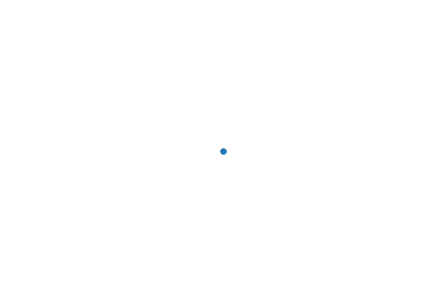

{'LCC': 1,
 'claw_count': 0.0,
 'cpl': nan,
 'd': 1.0,
 'd_max': 1.0,
 'd_min': 1.0,
 'edge_num': 1,
 'gini': -2.0,
 'n_components': 1,
 'node_num': 1,
 'power_law_exp': inf,
 'rel_edge_distr_entropy': -inf,
 'square_count': 0,
 'triangle_count': 0,
 'wedge_count': 0.0}


Not enough data. Returning nan
Not enough data. Returning nan


KeyboardInterrupt: ignored

In [22]:
av_size = 0  # set 0 if you do not need attr_vec
# d_size = 8
#z_size = 64
#gc_size = 16
d_size = 16
z_size = 16
gc_size = 32
z_out_size = z_size + av_size
rep_size = 32

adj_thresh = .7
max_epochs = 1000
lr = 3e-4


beta = 5
alpha = 0.1
gamma = 15

G = Generator(
    av_size=av_size,
    d_size=d_size,
    gc_size=gc_size,
    z_size=z_size,
    z_out_size=z_out_size,
    rep_size=rep_size
).cuda()

D = Discriminator(
    av_size=av_size,
    d_size=d_size,
    gc_size=gc_size
).cuda()

criterion_bce = nn.BCELoss()
criterion_bce.cuda()

loss_MSE = nn.MSELoss()
loss_MSE.cuda()      
loss_BCE = nn.BCEWithLogitsLoss(size_average=False)
loss_BCE.cuda()      


# loss for A and A'
# todo: add the loss to main
criterion_bcell = nn.BCEWithLogitsLoss()
criterion_bcell.cuda()


opt_enc = optim.RMSprop(G.encoder.parameters(), lr=lr)
opt_dec = optim.RMSprop(G.decoder.parameters(), lr=lr)
opt_dis = optim.RMSprop(D.parameters(), lr=lr * alpha)

for epoch in range(max_epochs):
    D_real_list, D_rec_enc_list, D_rec_noise_list, D_list = [], [], [], []
    # g_loss_list, rec_loss_list, prior_loss_list = [], [], []
    g_loss_list, rec_loss_list, prior_loss_list, aa_loss_list = [], [], [], []
    # for i in range(len(t_adj_mats)):
    # Only train the 8th graph
    for i in range(8, 9): 
        ones_label = Variable(torch.ones(1)).cuda()
        zeros_label = Variable(torch.zeros(1)).cuda()
        
        adj = Variable(t_adj_mats[i]).cuda()
        if adj.shape[0] <= d_size:
            continue
            
        if av_size == 0:
            attr_vec = None
        else:
            attr_vec = Variable(t_attr_vecs[i, :]).cuda()
        
        G.set_attr_vec(attr_vec)
        D.set_attr_vec(attr_vec)
        
        mean, logvar, rec_adj = G(adj)
        
        noisev = torch.randn(mean.shape, requires_grad=True).cuda()
        noisev = cat_attr(noisev, attr_vec)
        rec_noise = G.decoder(noisev)
        
        # train discriminator
        output = D(adj)
        errD_real = criterion_bce(output, ones_label)
        D_real_list.append(output.data.mean())
        output = D(rec_adj)
        errD_rec_enc = criterion_bce(output, zeros_label)
        D_rec_enc_list.append(output.data.mean())
        output = D(rec_noise)
        errD_rec_noise = criterion_bce(output, zeros_label)
        D_rec_noise_list.append(output.data.mean())
        
        dis_img_loss = errD_real + errD_rec_enc + errD_rec_noise
        # print ("print (dis_img_loss)", dis_img_loss)
        D_list.append(dis_img_loss.data.mean())
        opt_dis.zero_grad()
        dis_img_loss.backward(retain_graph=True)
        opt_dis.step()
        
        
        # AA_loss b/w rec_adj and adj
        #aa_loss = loss_MSE(rec_adj, adj)
        aa_loss = loss_BCE(rec_adj, adj)
        errG_rec_enc = criterion_bce(output, ones_label)
        errG_rec_noise = criterion_bce(output, ones_label)

        
        # train decoder
        output = D(adj)
        errD_real = criterion_bce(output, ones_label)
        output = D(rec_adj)
        errD_rec_enc = criterion_bce(output, zeros_label)
        output = D(rec_noise)
        errD_rec_noise = criterion_bce(output, zeros_label)
        
        similarity_rec_enc = D.similarity(rec_adj)
        similarity_data = D.similarity(adj)
        
        dis_img_loss = errD_real + errD_rec_enc + errD_rec_noise 
        # print (dis_img_loss)
        gen_img_loss = aa_loss + errG_rec_enc # - dis_img_loss 
        
        g_loss_list.append(gen_img_loss.data.mean())
        rec_loss = ((similarity_rec_enc - similarity_data) ** 2).mean()
        rec_loss_list.append(rec_loss.data.mean())
        err_dec = gamma * rec_loss + gen_img_loss
        
        opt_dec.zero_grad()
        err_dec.backward(retain_graph=True)
        opt_dec.step()
        
        # train encoder
        # fix me: sum version of prior loss
        pl = []
        for i in range(mean.size()[0]):
            prior_loss = 1 + logvar[i, :] - mean[i, :].pow(2) - logvar[i, :].exp()
            prior_loss = (-0.5 * torch.sum(prior_loss))/torch.numel(mean[i, :].data)
            pl.append(prior_loss)
        prior_loss_list.append(sum(pl))
        err_enc = sum(pl) + beta * rec_loss
        
        opt_enc.zero_grad()
        err_enc.backward()
        opt_enc.step()
    if epoch % 50 == 0:   
        print('[%d/%d]: D_real:%.4f, D_enc:%.4f, D_noise:%.4f, Loss_D:%.4f, Loss_G:%.4f, rec_loss:%.4f, prior_loss:%.4f' 
               % (epoch, 
                  max_epochs, 
                  torch.mean(torch.stack(D_real_list)), 
                  torch.mean(torch.stack(D_rec_enc_list)), 
                  torch.mean(torch.stack(D_rec_noise_list)), 
                  torch.mean(torch.stack(D_list)), 
                  torch.mean(torch.stack(g_loss_list)),
                  torch.mean(torch.stack(rec_loss_list)),
                  torch.mean(torch.stack(prior_loss_list))))
        
        #show_graph(F.sigmoid(rec_adj), thresh=adj_thresh)
        print(rec_adj.cpu())
        show_graph(rec_adj, thresh=adj_thresh)


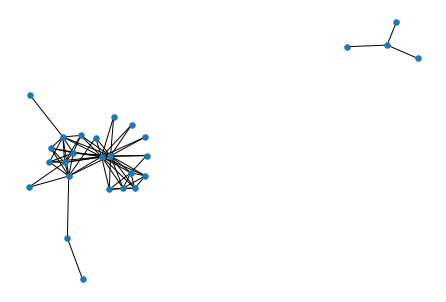

{'LCC': 23,
 'claw_count': 2321.0,
 'cpl': 1.972972972972973,
 'd': 5.518518518518518,
 'd_max': 19.0,
 'd_min': 1.0,
 'edge_num': 80,
 'gini': 0.3629132488192892,
 'n_components': 2,
 'node_num': 27,
 'power_law_exp': 1.7407181084866636,
 'rel_edge_distr_entropy': 0.904498149096874,
 'square_count': 72,
 'triangle_count': 90,
 'wedge_count': 627.0}


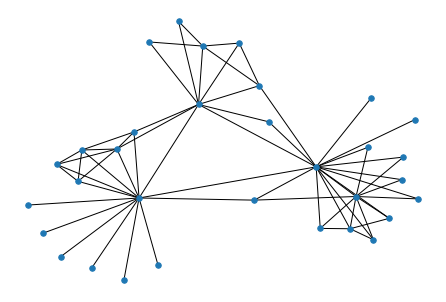

{'LCC': 32,
 'claw_count': 1596.0,
 'cpl': 2.3245967741935485,
 'd': 4.25,
 'd_max': 17.0,
 'd_min': 1.0,
 'edge_num': 74,
 'gini': 0.39384191176470584,
 'n_components': 1,
 'node_num': 32,
 'power_law_exp': 1.9239288502966194,
 'rel_edge_distr_entropy': 0.8976358560312341,
 'square_count': 11,
 'triangle_count': 41,
 'wedge_count': 476.0}


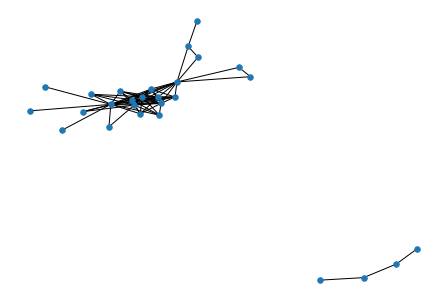

{'LCC': 23,
 'claw_count': 2823.0,
 'cpl': 1.9613899613899615,
 'd': 6.111111111111111,
 'd_max': 18.0,
 'd_min': 1.0,
 'edge_num': 90,
 'gini': 0.37530864197530867,
 'n_components': 2,
 'node_num': 27,
 'power_law_exp': 1.7071269400043416,
 'rel_edge_distr_entropy': 0.8995239216942547,
 'square_count': 181,
 'triangle_count': 136,
 'wedge_count': 768.0}


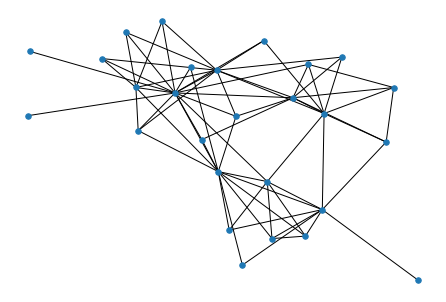

{'LCC': 27,
 'claw_count': 1723.0,
 'cpl': 2.076923076923077,
 'd': 5.555555555555555,
 'd_max': 17.0,
 'd_min': 1.0,
 'edge_num': 82,
 'gini': 0.3056790123456792,
 'n_components': 1,
 'node_num': 27,
 'power_law_exp': 1.6888056107730427,
 'rel_edge_distr_entropy': 0.9279377358656993,
 'square_count': 15,
 'triangle_count': 55,
 'wedge_count': 558.0}


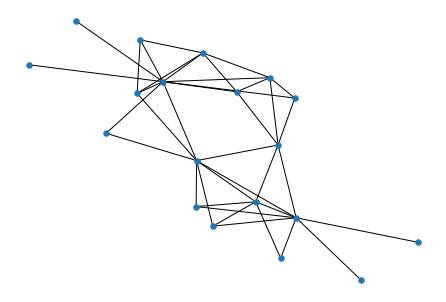

{'LCC': 19,
 'claw_count': 470.0,
 'cpl': 2.1695906432748537,
 'd': 4.631578947368421,
 'd_max': 11.0,
 'd_min': 1.0,
 'edge_num': 50,
 'gini': 0.2440191387559809,
 'n_components': 1,
 'node_num': 19,
 'power_law_exp': 1.7723466453854786,
 'rel_edge_distr_entropy': 0.9326146679265659,
 'square_count': 5,
 'triangle_count': 24,
 'wedge_count': 239.0}


In [0]:
def test_gen(model, n, attr_vec):
    fixed_noise = torch.randn((n, z_size), requires_grad=True).cuda()
    if attr_vec:
        fixed_noise = cat_attr(fixed_noise, attr_vec.cuda())
    a_ = model.decoder(fixed_noise)
    show_graph(F.sigmoid(a_), thresh=.53)

for _ in range(5):
    test_gen(G, 40, None)

# for _ in range(5):
#     test_gen(G, 10, t_attr_vecs[1, :])
    

In [0]:
print(G)
print(D)